# 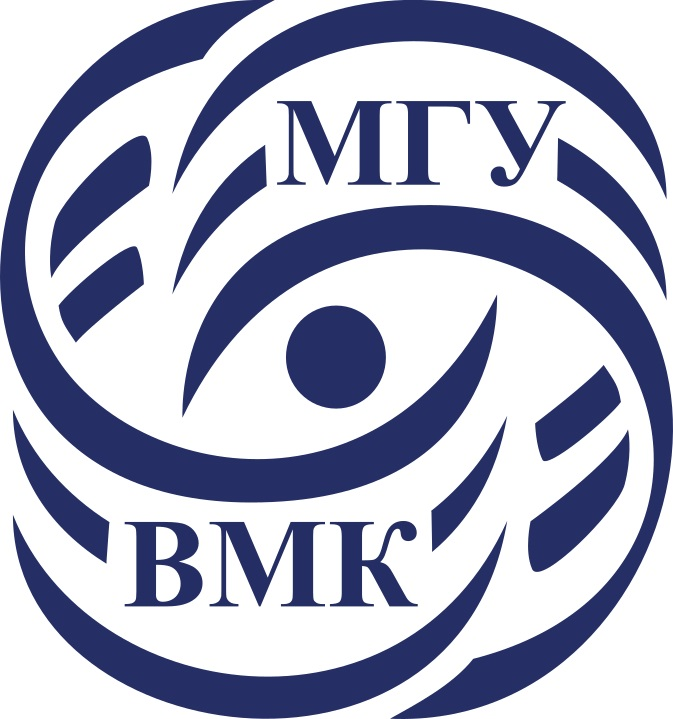

# Машинное обучение. ВМК МГУ

# Практическое задание 9: Кластеризация. Методы снижения размерности.

## Важно! О формате сдачи

* Практически все выделенные задания из ноутбука оцениваются по системе <font color='red'>кросс-рецензирования.</font> Задания, в которых надо реализовать свой код и послать в систему, выделены здесь и в PDF отдельно.
* В этом задании также есть задания по типу <font color='red'>unit-test.</font>
* При решении ноутбука <font color='red'>используйте данный шаблон.</font> Не нужно удалять текстовые ячейки с разметкой частей ноутбука и формулировками заданий. Добавлять свои ячейки, при необходимости, конечно, можно.
* Везде, где в формулировке задания есть <font color='red'>какой-либо вопрос (или просьба вывода),</font> необходимо прописать ответ в ячейку (код или Markdown).
* Наличие <font color='red'>кода решения обязательно.</font> Письменные ответы на вопросы без сопутствующего кода оцениваются в 0 баллов.
* Если в ячейке написана фраза <font color='red'>"Вывод"/"Ответ на вопрос" и.т.д.,</font> то ожидается ответ в виде текста (можете добавить ячейки с кодом, если считаете это необходимым, но это необязательно). Если в ячейке написано <font color='red'>"Your code here" и пр. </font>, то ожидается ответ в виде кода (можете добавить ячейки с кодом, если считаете это необходимым, но это необязательно). Если есть и ячейка с фразой "Вывод", и ячейка с фразой "Your code here", то в ответе ожидается и код, и текст

**А также..**

Если в ячейке написана фраза `Ваш ответ здесь: (ｏ・_・)ノ”(ノ_<、)`, то ожидается ответ в виде текста (можете добавить ячейки с кодом, если считаете это необходимым, но это необязательно). Если в ячейке написано `# Ваш код здесь:＼(º □ º l|l)/`, то ожидается ответ в виде кода (можете добавить ячейки с кодом, если считаете это необходимым, но это необязательно). Если есть и ячейка с фразой `Ваш ответ здесь: (ｏ・_・)ノ”(ノ_<、)`, и ячейка с фразой `# Ваш код здесь:＼(º □ º l|l)/`, то в ответе ожидается и код, и текст)

**В этом задании вы..:**

* Познакомитесь с одним способом визуализации процесса обучения
* Сравните между собой результаты разных способов кластеризации
* Посмотрите и реализуете несколько метрик качества кластеризации
* Попробуете разные методы снижения размерности

<font color=orange><h3>*Примерное время выполнения (execution time/время выполнения, если нажать run all) всех ячеек ноутбука (без ML-решения): 30 минут*</font></h3>

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

Перед началом выполнения переведите ноутбук в `Доверенный режим` (`Trusted`) для корректного отображения изображений:

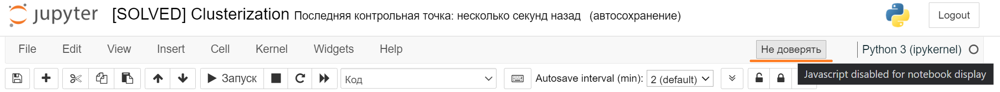

In [1]:
%config Completer.use_jedi = False
%load_ext autoreload
%autoreload 2

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

# <font color='orange'>0. Введение. [кросспроверка 2 балла]</font>

## 0.1 О задании

В данной работе вам предстоит познакомится с методами машинного обучения без учителя — кластеризацией и алгоритмами снижения размерности.

В данном задании предлагается две основных части ($1, 2$) и одна вспомогательная ($0$). Сумарное всемя выполнения ноутбука порядка двух часов при выполнении в сервисах `Kaggle`/`Google Colab`. Рекомендуется использовать Kaggle так как в нём корректно работают интерактивные визуализации.

## 0.2 Необходимые библиотеки

### Установка в Google Colab
Если вы используете Google Colab, то вам достаточно установить библиотеки с помощью ячейки ниже.

После установки нужных версий нажмите на кнопку `Restart runtime`, которая появится в следующей ячейке после завершения ее выполнения.

После перезапуска (`Restart runtime`) устанавливать библиотеки еще раз не нужно, достаточно проверить, что установилась их новая версия.

**Важно!**
Устанавливать нужные версии нужно каждый раз, когда создается новый рантайм. Например, если вы 2 часа подряд делаете это задание, то подготовить библиотеки достаточно 1 раз. Но если вы, например, начали в понедельник, затем закрыли/выключили ноутбук, то при продолжении в среду, вам нужно будет запустить рантайм заново и следовательно заново установить библиотеки.

<font color='red'>**Внимание!**</font> В этом задании мы будем использовать полное виртуальное окружение, так как понадобятся библиотеки `torch` и `tensorflow`

**Обратите внимание, что установка `torch` и `tensorflow` через `pip` может сломать ваше окружение, особенно если вы используете GPU. Выполняйте их установку в соответствии с Вашей конфигурацией системы или в отдельном виртуальном окружении**

In [2]:
! pip install --upgrade gdown
! gdown 13tID3G5Bd5rKtmUd_s6SvSI_bG3zgmAS
! pip install -r ./requirements_2023_24.txt

Downloading...
From: https://drive.google.com/uc?id=13tID3G5Bd5rKtmUd_s6SvSI_bG3zgmAS
To: /content/requirements_2023_24.txt
100% 443/443 [00:00<00:00, 1.55MB/s]


In [3]:
import catboost
assert(catboost.__version__ == '1.2.1')

Здесь перечислены основные функции и библиотеки, которые могут понадобиться Вам в процессе выполнения задания. Подключение других библиотек возможно, но нежелательно. **Работа каких-либо других библиотек не гарантируется.**

In [4]:
import os

import gdown

import scipy

import numpy as np

import tqdm.auto as tqdm

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

from ipywidgets import interactive, fixed, interact_manual, IntSlider, FloatLogSlider, FloatSlider

import torch
from torchvision.datasets import CIFAR10

# Необходима преварительная установка tensorflow
from keras.applications.inception_v3 import InceptionV3, preprocess_input

import sklearn

from sklearn.decomposition import KernelPCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering

# Библиотека umap-learn, а не umap
from umap import UMAP
from sklearn.manifold import TSNE, Isomap

from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification, make_moons, make_blobs
from sklearn.preprocessing import StandardScaler, MinMaxScaler

from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

/usr/local/lib/python3.10/dist-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/usr/local/lib/python3.10/dist-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/usr/local/lib/python3.10/dist-packages/umap/distances.py:1086: NumbaDeprecationWarning: The 'nopython' keyword argume

## <font color='orange'>0.3 Введение в интерактивные графики jupyter notebook [кросспроверка 2 балла]</font>

Информация об особенностях интерактивных графиков вынесена в отдельный ноутбук `Deep dive into .ipynb.ipynb`. **Ознакомьтесь с ним перед дальнейшим выполнением задания!**

#### **Задание 0.0 [кросспроверка, 2 балла][код, вопрос]**
* Поиграйтесь с интерактивными графиками.
* Посмотрите в чём заключается смысл функций [`interactive`, `interact_manual`, `fixed`, `IntSlider`, `FloatLogSlider`](https://ipywidgets.readthedocs.io/en/latest/examples/Using%20Interact.html).
* Какие ещё [слайдеры и динамические виджеты бывают](https://ipywidgets.readthedocs.io/en/latest/examples/Widget%20List.html)?
* Как вам кажется, удобный ли это инструмент?
* Предложите несколько примеров, когда он мог бы ещё пригодиться.

In [5]:
# Interactive
from ipywidgets import widgets
def square(x):
    return x * x

slider = widgets.IntSlider(min=0, max=10, step=1, value=5)
interactive(square, x=slider)

interactive(children=(IntSlider(value=5, description='x', max=10), Output()), _dom_classes=('widget-interact',…

In [6]:
slider # Behavior propagates to the above piece

IntSlider(value=5, description='x', max=10)

In [7]:
# Interact
from ipywidgets import interact, widgets

def square(x):
    return x * x

# Define a function to create the IntSlider widget
def create_slider():
    return widgets.IntSlider(min=0, max=10, step=1, value=5)

# Create the IntSlider widget
slider = create_slider()

# Call interact with the target function and the widget object
interact(square, x=slider)

interactive(children=(IntSlider(value=5, description='x', max=10), Output()), _dom_classes=('widget-interact',…

<function __main__.square(x)>

In [8]:
interact(square, x=slider) # Behavior propagates to the above piece

interactive(children=(IntSlider(value=5, description='x', max=10), Output()), _dom_classes=('widget-interact',…

<function __main__.square(x)>

In [9]:
# Fixed with Interact_manual
# Define the function to square a number
def create_slider():
    return widgets.IntSlider(min=0, max=10, step=1, value=5)

# Create the IntSlider widget
slider = create_slider()

def mult(x, y):
    return x * y

# Use interact_manual to create an interactive widget for the square function with a fixed value
interact_manual(mult, x=widgets.fixed(4), y=slider)

interactive(children=(IntSlider(value=5, description='y', max=10), Button(description='Run Interact', style=Bu…

<function __main__.mult(x, y)>

In [10]:
# IntSlider vs FloatLogSlider

# Function to display the square of a number
def display_square(x):
    return x * x

# Using IntSlider
@interact(x=widgets.IntSlider(min=0, max=10, step=1, value=5, description='Integer'))
def square_with_int_slider(x):
    return display_square(x)

# Using FloatLogSlider
@interact(x=widgets.FloatLogSlider(min=-1, max=2, step=0.1, value=1, base=10, description='Float (Log Scale)'))
def square_with_float_log_slider(x):
    return display_square(x)

interactive(children=(IntSlider(value=5, description='Integer', max=10), Output()), _dom_classes=('widget-inte…

interactive(children=(FloatLogSlider(value=1.0, description='Float (Log Scale)', max=2.0, min=-1.0), Output())…

<font color='magenta'>*Ваш ответ здесь:*</font> (ｏ・_・)ノ”(ノ_<、) <br>
Еще бывают такие: https://ipywidgets.readthedocs.io/en/latest/examples/Widget%20List.html <br>
FloatSlider, FloatRangeSlider - примеры слайдеров <br>
VBox, Hbox - контейнеры <br>
...и много чего еще :) <br>
СМ. ДАЛЕЕ

In [11]:
# An example with the other widgets:
from ipywidgets import Checkbox, VBox

def handle_checkbox_change(change):
    if change.new:
        print("Checkbox is checked.")
    else:
        print("Checkbox is unchecked.")

# Create a Checkbox widget with an initial value of False
checkbox = Checkbox(description='Check me', value=False)

# Attach a callback function to the checkbox to handle value changes
checkbox.observe(handle_checkbox_change, names='value')

# Display the checkbox widget
VBox([checkbox])

In [12]:
# INTERACTIVE PLOT EXAMPLE

import matplotlib.pyplot as plt
import numpy as np
from ipywidgets import interact, widgets

def plot_sine_wave(freq):
    x = np.linspace(0, 10, 1000)
    y = np.sin(freq * x)

    plt.figure(figsize=(3, 2))
    plt.plot(x, y)
    plt.title('Sine Wave')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.grid(True)
    plt.show()

interact(plot_sine_wave, freq=widgets.FloatSlider(min=0.1, max=10, step=0.1, value=1.0))

interactive(children=(FloatSlider(value=1.0, description='freq', max=10.0, min=0.1), Output()), _dom_classes=(…

<function __main__.plot_sine_wave(freq)>

<h2><font color='magenta'>--> Ответ: <--</font></h2> Да, это удобный инструмент. Можно также встраивать различные панели управления благодаря виджетам. <br> Можно референсить один и тот же виджет и изменять в ноутбуке его несколько раз, не прогоняя весь код заново.

**<font color='red'>Обратите внимание</font>, что динамическое содержимое может некорректно сохраняться в jupyter notebook. Используйте его только для локальной визуализации. Все графики, необходимые для сдачи задания должны быть статическими. Переход в статический режим происходит с помощью магической команды `%matplotlib inline`.**

**<font color='red'>Обязательно убедитесь, что все графики корректно сохранились корректно в ноутбуке перед сдачей в систему.</font>**

In [13]:
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 300
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('pdf', 'svg')

## 0.4 Ещё несколько важных замечаний

При выполнении задания запрещено:
1. Менять те seed, которые явно указаны в коде
2. Менять прототипы функций, классов, методов классов
3. Менять константы, используемые для генерации выборок

При оформлении задания обратите внимание на форматирование кода и на оформление графиков:

* Весь код должен быть оформлен в строгом соответствии с [PEP8](https://pep8.org/)

Графики должны быть с одной стороны понятными и информативными, а с другой стороны *красивыми*. Вот несколько пунктов, которые помогут удовлетворить этим требования:
1. Все графики должны быть отрисованы в **векторном формате**. Обратите внимание, что смена режима графиков с динамического на статический и обратно может приводить к сбросу параметров отрисовки графиков. Переход в векторный режим можно выполнить с помощью команды `matplotlib_inline.backend_inline.set_matplotlib_formats('pdf', 'svg')`. Если изображения в векторном формате приводят к слишком большому размеру Jupyter Notebook можете использовать растровые изображения с **высоким dpi**. Напирмер, можно установить глобальный dpi в matplotlib: `matplotlib.rcParams['figure.dpi'] = 300`
2. На всех графиках без исключения должна быть нарисована сетка
3. Все графики и группы графиков должны иметь заголовок (`title`)
4. При необходимости оси должны быть подписаны
5. Если на графике отображено несколько сущностей (линии/точки/bar разных цветов, формы и так далее), то необходима исчерпывающая легенда
6. Все линии на графиках должны быть чётко видны (нет похожих цветов или цветов, сливающихся с фоном и так далее)
7. Масштаб по каждой оси на графике должен быть выбран правильно. Используйте масштабы `log`, `symlog` по необходимости
8. Если отображена величина, имеющая очевидный диапазон значений (например, проценты могут быть от 0 до 100), то желательно масштабировать ось на весь диапазон значений (исключением является случай, когда вам необходимо показать малое отличие, которое незаметно в таких масштабах)
9. Частота отметок по каждой оси должна быть тщательно подобрана, по необходимости задавайте `[xy]ticks`, `[xy]ticklabels` вручную. Подписи тиков на осях не должны сливаться как на одной оси, так и между ними
10. Помните, что matplotlib умеет выполнять [рендеринг Latex](https://matplotlib.org/stable/gallery/text_labels_and_annotations/tex_demo.html). Используйте эту возможность для написания формул в заголовках, легенде и в подписях осей
11. Используйте *красивую* цветовую палитру с хорошо различимыми цветами. Примеры цветовых палитр можно посмотреть [здесь](https://matplotlib.org/stable/gallery/color/colormap_reference.html). При наличи особенностей восприятия цвета можно использовать специальные палитры:
```python
plt.style.use('seaborn-colorblind')
# Или
plt.style.use('tableau-colorblind10')
# Затем, при отрисовке графиков не используйте параметр cmap
```
12. Графики должны быть не супер-микро и не супер-макро по размерам, так, чтобы можно было увидеть все, что нужно

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

# <font color='orange'>1. Кластеризация на синтетических данных. [кросспроверка 20 баллов,  unittests 16 баллов]</font>

В данной части мы рассмотрим несколько наборов синтетических данных и сравним как разные алгоритмы кластеризации ведут себя в низкоразмерных и высокоразмерных пространствах

## a. Двумерные данные

Сгенерируем двумерные данные с $4$ естественными кластерами разного размера и плотности.

In [14]:
data_moons, labels_moons = make_moons(n_samples=300, shuffle=True, noise=0.09, random_state=6417)
data_moons, labels_moons = data_moons[labels_moons == 0], labels_moons[labels_moons == 0]

data_blobs, labels_blobs = make_blobs(
    n_samples=500, n_features=2, centers=[(0, -0.2), (-1.5, -1.5), (-1.5, 1.5)],
    cluster_std=[0.2, 0.4, 0.6], center_box=[-10.0, 10.0],
    shuffle=True, random_state=6417, return_centers=False
)

data = np.concatenate([data_moons, data_blobs])
labels = np.concatenate([labels_moons, labels_blobs + 1])

Определим вспомогательную функцию для отрисовки двумерных кластеризованных данных. При выполенении задания желательно пользоваться этой функцией для визуализации. При необходимости можете менять сигнатуру и поведение функции как вам удобно, _оставляя стиль отрисовки в целом неизменным_.

In [15]:
def plot_2d_data(data, labels, title='Исходные данные', cmap='tab20', ax=None):
    '''
    Отрисовка 2d scatter plot.
    :param np.ndarray data: 2d массив точек
    :param Union[list, np.ndarray] labels: список меток для каждой точки выборки
    :param str title: Заголовок графика
    :param str cmap: Цветовая палитра
    :param ax Optional[matplotlib.axes.Axes]: Оси для отрисовки графика.
        Если оси не заданы, то создаётся новая фигура и сразу же происходит её отрисовка
        Иначе, график добавляется на существуюущие оси. Отрисовки фигуры не происходит
    '''
    n_clusters = len(np.unique(labels))

    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    else:
        fig = None

    scatter = ax.scatter(
        data[:, 0], data[:, 1], c=labels,
        cmap=plt.get_cmap(cmap, n_clusters)
    )

    cbar = plt.colorbar(scatter, label='Номер кластера', ax=ax)
    cbar.set_ticks(np.min(labels) + (np.arange(n_clusters) + 0.5) * (n_clusters - 1) / n_clusters)
    cbar.set_ticklabels(np.unique(labels))

    ax.set_title(title)
    ax.grid(True)

    if fig is not None:
        fig.tight_layout()
        plt.show()

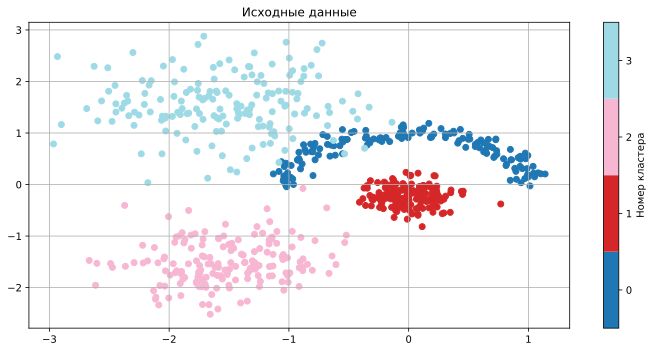

In [16]:
plot_2d_data(data, labels, title='Исходные данные', cmap='tab20')

#### <font color='orange'>**Задание 1.a.1 [кросспроверка, 3 балла][код]** </font>
<a id='task_1.a.1'></a>
Запустите следующие алгоритмы кластеризации на данной выборке: `KMeans`, `DBSCAN`, `AgglomerativeClustering`. Визуально подберите наилучшие параметры для этих алгоритмов (`n_clusters`, `eps`, `min_samples`, `linkage`). Изобразите наилучшие получившиеся разбиения на графиках.

*Советы:*
1. Можете использовать виджеты для ручного подбора параметров
2. Используйте `plot_2d_data` для отрисовки графиков. Обязательно меняйте заголовок
3. **<font color='red'>Помните, динамический контент может не сохраняться в ноутбуке. Поэтому после подбора оптимальных параметров нарисуйте соответствующий рисунок в статическом режиме</font>**

In [17]:
def plot_kmeans(n_clust, state, data):
    model=KMeans(n_clusters=n_clust, init='random', n_init='auto', random_state=state, copy_x=True, algorithm='lloyd')
    labels = model.fit_predict(data)
    plot_2d_data(data, labels, title=f'KMeans with K={n_clust}, random_state={state}', cmap='tab20', ax=None)

def plot_dbscan(eps, data):
    model=DBSCAN(eps=eps, algorithm='auto')
    labels = model.fit_predict(data)
    plot_2d_data(data, labels, title=f'DBSCAN with eps={eps}', cmap='tab20', ax=None)

def plot_agglomerative(distance_threshold, linkage, data, metric):
    model=AgglomerativeClustering(n_clusters=None, distance_threshold=distance_threshold, linkage=linkage, metric=metric)
    labels = model.fit_predict(data)
    plot_2d_data(data, labels, title=f'Agglomerative clustering with distance_threshold={distance_threshold}, linkage={linkage}', cmap='tab20', ax=None)

In [18]:
scaler = StandardScaler()
data_new = scaler.fit_transform(data)
interactive_plot = interactive(
    plot_kmeans,
    n_clust=widgets.IntSlider(min=0, max=30, step=1, value=5),
    state=widgets.IntText(value=5),
    data=fixed(data_new)
)
interactive_plot

interactive(children=(IntSlider(value=5, description='n_clust', max=30), IntText(value=5, description='state')…

<h4> В оригинальных данных 4 кластера, но правдоподобнее выглядит 3. Алгоритм [с данными параметрами] не способен отделить кластер-луну от одного из двух соседей так, чтобы остальные кластеры выглядели нормально</h4>

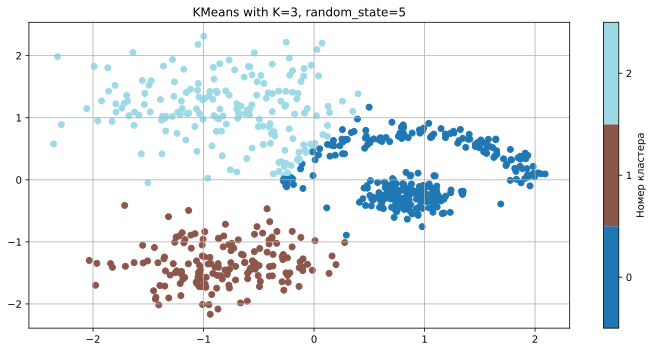

In [19]:
scaler = StandardScaler()
data_new = scaler.fit_transform(data)
plot_kmeans(3, 5, data_new)

In [20]:
scaler = StandardScaler()
data_new = scaler.fit_transform(data)
interactive_plot = interactive(
    plot_dbscan,
    eps=widgets.FloatText(value=5),
    data=fixed(data_new)
)
interactive_plot

interactive(children=(FloatText(value=5.0, description='eps'), Output()), _dom_classes=('widget-interact',))

<h4>Правдоподобнее всего на интерактивных графиках выглядел eps=0.182</h4>

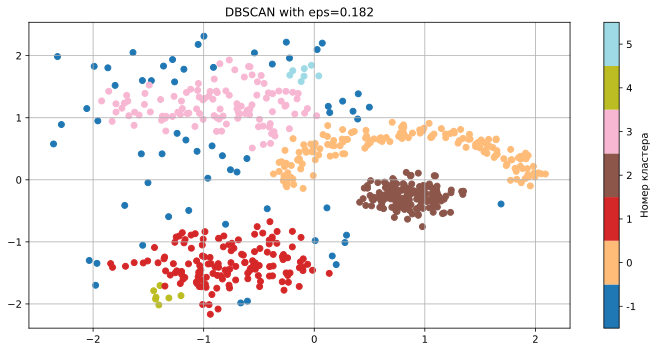

In [21]:
scaler = StandardScaler()
data_new = scaler.fit_transform(data)
plot_dbscan(eps=0.182, data=data_new)

In [22]:
scaler = StandardScaler()
data_new = scaler.fit_transform(data)
interactive_plot = interactive(
    plot_agglomerative,
    distance_threshold=widgets.FloatText(value=3),
    linkage = widgets.RadioButtons(options=['complete', 'ward', 'average', 'single']),
    data=fixed(data_new),
    metric=fixed('euclidean')
)
interactive_plot

interactive(children=(FloatText(value=3.0, description='distance_threshold'), RadioButtons(description='linkag…

Разделение посредственное, однако расстояние Варда выглядит достаточно правдоподобно в случаях с разным числом кластеров

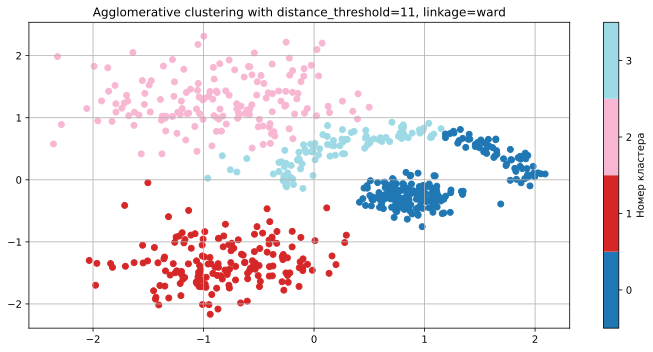

In [23]:
scaler = StandardScaler()
data_new = scaler.fit_transform(data)
plot_agglomerative(
    distance_threshold=11,
    linkage='ward',
    metric='euclidean',
    data=data_new
)

In [24]:
from sklearn.cluster import SpectralClustering

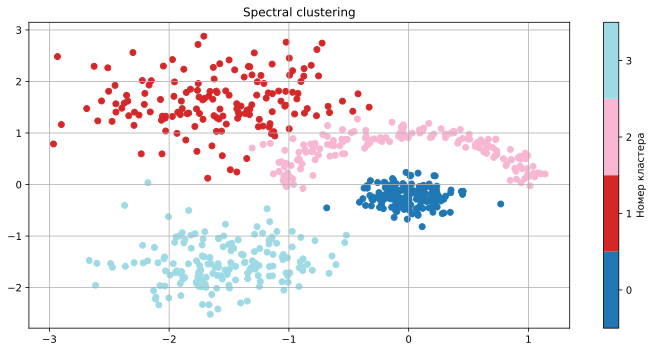

In [25]:
scaler = StandardScaler()
data_new = scaler.fit_transform(data)
model = SpectralClustering(n_clusters=4, gamma=55, random_state=42, affinity='rbf')
labels = model.fit_predict(data)
plot_2d_data(data, labels, title=f'Spectral clustering', cmap='tab20', ax=None)

<h3>Вывод:</h3> Кластеризация любым из предложенных способов дает посредственный результат. <br>
<br>
[Зато спектральная кластеризация дает сочный результат, однако этот алгоритм не был упомянут в задании.]

#### <font color='orange'>**Задание 1.a.2 [кросспроверка, 2 балла][вопрос]**</font>
Основываясь на знании о работе данных алгоритмов, объясните, почему кластеры были сформированы таким образом. Какой алгоритм лучше всего работает на предложенных данных?

<font color='magenta'>*Ваш ответ здесь:*</font> <br>
<h2>ВЫВОД</h2> СМ. ВЫШЕ + ниже: <br>
<h4><font color='lime'>KMeans</font> кластеризует по близости к центроидам, которые интеративно вычисляются. Понятно, что лунный кластер имеет центр близко к кластеру внутри полумесяца, поэтому кластеризация посредственная <br>
<font color='lime'>DBSCAN</font> маркирует точки и строит окрестности, определяя так принадлежности к кластерам. Хорош для задач кластеризации с кластерами одинаковых плотностей - немного не то, что имеем мы. <br>
<font color='lime'>Иерархическая кластеризация</font> использует т.н. "линкедж", т.е. "связи" для определения принадлежности к кластерам. Использует подход bottom-up, принимая изначально все точки отдельными кластерами (по крайней мере по инфе, которую нашел я :) ). Сингл-линк не даст нормального результата, т.к. объединяет по близости (объединит луну и лево верх). Аверадж линк не даст норм результата, т.к. объединит луну и "центр" луны, т.к. луна слишком вытянутая. Комплит-линк объединяет, опираясь на самые большие дистанции между элементами кластера. Он может [ошибочно] объединить два находящихся рядом плотных кластера, что успешно и делает в нашем случае (протестировано на интерактивном графике). Линкедж Варда при объединении кластеров смотрит на уменьшение дисперсии. Он тоже не дает нормального результата из-за слишком большой вытянутости луны </h4>
<h2><font color='gold'>DBSCAN</font> оказался самым правдоподобным.</h2> Он смог более-менее адекватно отделить луну, хотя и сформировал 2 кластера вне оригинальных данных. Он требует тщательного подбора параметров, но может кластеризовать сложные формы

## b. Многомерные данные. Снижение размерности

Теперь попробуем кластеризовать данные в высокоразмерном пространстве. Существенным отличием от двумерного случая является невозможность прямой визуальной оценки кластеризации.

Одним из наглядных способов оценки кластеризации является снижение размерности. В данной части вам предлагается использовать алгоритм `TSNE` для визуализации данных.

In [26]:
data, labels = make_classification(
    n_samples=1000, n_features=200, n_informative=100,
    n_repeated=0, n_classes=5, n_clusters_per_class=2, weights=None,
    flip_y=0.01, class_sep=2.5, hypercube=True, shift=0.0, scale=1.0,
    shuffle=True, random_state=6417
)

####<font color='orange'>**Задание 1.b.1 [кросспроверка, 2 балла][код, вопрос]**</font>
Примените алгоритм `TSNE` для снижения размерности до двух. Учтите, что `TSNE` суть есть метрический алгоритм и существенно зависит от масштаба признаков — некорректный и различающийся масштаб признаков гарантированно приведёт к неинтерпретируемым результатам. Можете попробовать подобрать гиперпараметры алгоритма для получения лучшей визуализации.

Изобразите получившиеся низкоразмерные вектора. Получилось ли сохранить кластеры при переходе в низкоразмерное пространство?

In [27]:
scaler = StandardScaler()
data_transformed = scaler.fit_transform(data)

model = TSNE(n_components=2, perplexity=50)
data_new = model.fit_transform(data_transformed)


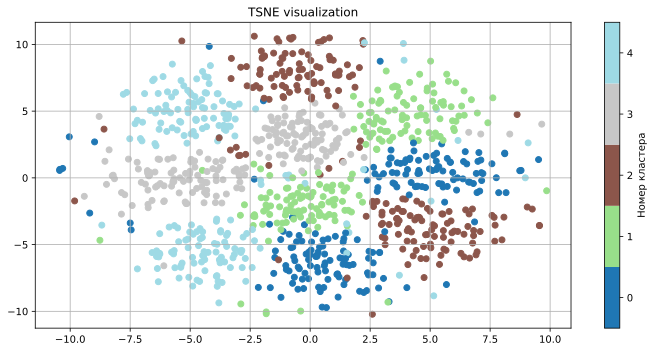

In [28]:
plot_2d_data(data_new, labels, title='TSNE visualization', cmap='tab20', ax=None)

<font color='magenta'>*Ваш ответ здесь:*</font> <br>
Четко прослеживаюстя кластеры. Скейлинг очень помог. Видно, что, как и задумано, есть 2 кластера каждого из 5 классов. Так, кластеры удалось сохранить

#### <font color='orange'>**Задание 1.b.2 [кросспроверка, 3 балла][код]**</font>
Примените алгоритмы кластеризации из предыдущего пункта к новым данным. Изобразите получившиеся кластеры в векторном пространстве, полученном с помощью `TSNE`. Не забудьте подобрать оптимальные параметры (те же, что и в пункте [**1.a.1**](#task_1.a.1)) для всех алгоритмов. Помните, что большинство алгоритмов кластеризации также являются метрическими и существенно зависят от масштаба признаков.

*Замечание:* Обратите внимание, что применять алгоритмы кластеризации нужно к высокоразмерным векторам, а низкоразмерные вектора необходимо использовать только для визуализации.

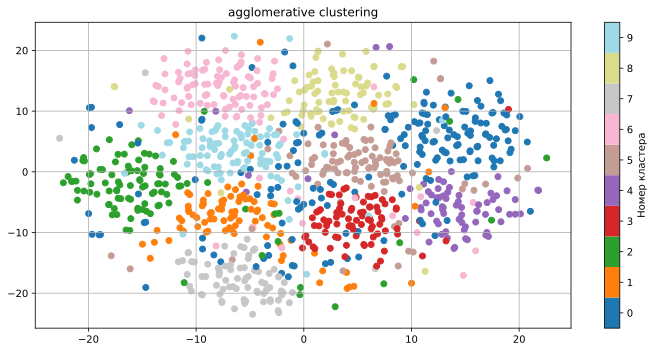

In [29]:
model = AgglomerativeClustering(
    n_clusters=10,
    linkage='ward',
    metric='euclidean'
)

scaler = StandardScaler()
data_transformed = scaler.fit_transform(data)

labels = model.fit_predict(data_transformed)
trans = TSNE()
plot_2d_data(trans.fit_transform(data_transformed), labels, title='agglomerative clustering')

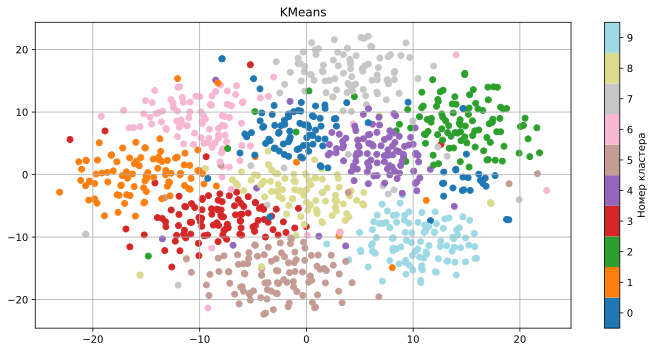

In [30]:
model = KMeans(
    n_clusters=10,
    n_init='auto'
)

scaler = StandardScaler()
data_transformed = scaler.fit_transform(data)

labels = model.fit_predict(data_transformed)
trans = TSNE()
plot_2d_data(trans.fit_transform(data_transformed), labels, title='KMeans')

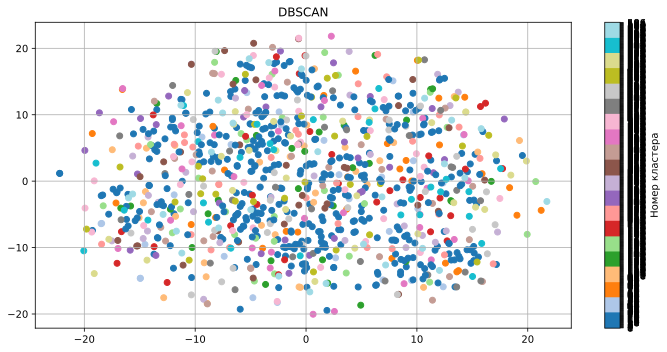

In [31]:
model = DBSCAN(
    eps=16.6,
    metric='euclidean',
    min_samples=1
)

'''
model = DBSCAN(
    eps=182,#16.3,
    metric='l1'
)
'''

scaler = StandardScaler()
data_transformed = scaler.fit_transform(data)

labels = model.fit_predict(data_transformed)
trans = TSNE()
plot_2d_data(trans.fit_transform(data_transformed), labels, title='DBSCAN')

#### <font color='orange'>**Задание 1.b.3 [кросспроверка, 2 балла][вопрос]**</font>
Опишите получившиеся результаты. Все ли алгоритмы одинаково хорошо разделяют данные? Если какой-то алгоритм не справился с задачей, то предположите почему.

<font color='magenta'>*Ваш ответ здесь:*</font> DBSCAN очень плохо работает на этих данных. Его не применяют для больших размерностей. Параметр eps не удается подобрать. Это связано с проклятием размерности. Чем больше признаков, тем больше вероятность того, что по одному из признаков будет выброс. Эпсилон подобрать нереально, т.к. при малых его значениях в окрестности очень большого числа точек не будет достаточного числа соседей для определения к конкретному кластеру (либо будут отдельными кластерами, либо шумом, в зависимости от min_samples), а при больших значениях точки без значительных выбросов будут определены в один большой кластер. <br>
Это предположение можно подкрепить, подправив параметры, отвечающие за число классов

In [32]:
data, labels = make_classification(
    n_samples=1000, n_features=200, n_informative=100,
    n_repeated=0, n_classes=2, n_clusters_per_class=1, weights=None,
    flip_y=0.01, class_sep=2.5, hypercube=True, shift=0.0, scale=1.0,
    shuffle=True, random_state=6417
)

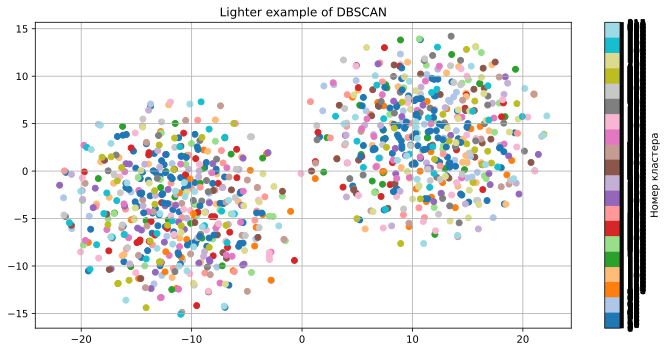

In [33]:
model = DBSCAN(
    eps=16,
    metric='euclidean',
    min_samples=1
)

'''
model = DBSCAN(
    eps=182,#16.3,
    metric='l1'
)
'''

scaler = StandardScaler()
data_transformed = scaler.fit_transform(data)

labels = model.fit_predict(data_transformed)
trans = TSNE()
plot_2d_data(trans.fit_transform(data_transformed), labels, title='Lighter example of DBSCAN')

In [34]:
# We dirtied our "data, labels" a bit. Correcting below
data, labels = make_classification(
    n_samples=1000, n_features=200, n_informative=100,
    n_repeated=0, n_classes=5, n_clusters_per_class=2, weights=None,
    flip_y=0.01, class_sep=2.5, hypercube=True, shift=0.0, scale=1.0,
    shuffle=True, random_state=6417
)

Кластеризация очевидно плохая. ДБСКАН подчеркивает разность по признакам с выбросами, опуская близость по остальным признакам, потому плохо кластеризует данные большой размерности <br>
В примере выше все данные с большим разбросом определены как шум, причем шума слишком много. И в то же время точки, которым повезло не быть выбросами, определены в отдельный кластер. <br>
То есть эпсилон подобрать не просто сложно, а не представляется возможным. ДБСКАН не будет работать в принципе

## c. Методы оценки кластеризации. Внутренние и внешние метрики.

Визуальная оценка кластеризации при работе с высокоразмерными данными затруднительна, так как существенно зависит от выбранного метода снижения размерности, который может плохо работать на конкретных данных. С другой стороны, визуальная оценка — субъективна. Поэтому необходимы численные оценки качества кластеризации.

В данном разделе вам нужно будет реализовать две метрики кластеризации и проверить их на практике.

Существует два основных подхода к оценке кластеризации — внутренние и внешние метрики. Первые используют только информацию о векторах-признаках объектов и метки кластеров, полученные из алгоритма кластеризации. Внешние же, используют информацию об истинной разметке объектов.

### Silhouette

Метрика `силуэт` является классическим представителем внутренних метрик кластеризации. Её суть заключается в оценке двух параметров, характеризующих выделенные кластеры — компактность и отделимость.

Положим, что $C_{i}$ — номер кластера для объекта $i$.

$s_{i}$ — компактность кластеризации объекта $i$ определяется как среднее расстояние от него до всех объектов того же кластера:
$$s_{i} = \frac{1}{|\{j : C_{j} = C_{i}\}| - 1} \sum\limits_{j : C_{j} = C_{i}} || x_{i} - x_{j} ||$$

$d_{i}$ — отделимость кластеризации объекта $i$ определяется как среднее расстояние от него до всех объектов второго по близости кластера:
$$ d_{i} = \min_{C: C \neq C_{i}} \frac{1}{|\{j : C_{j} = C\}|} \sum\limits_{j : C_{j} = C} || x_{i} - x_{j} || $$

Тогда силуэт объекта $i$:
$$\text{sil}_{i} = \frac{d_{i} - s_{i}}{\max(d_{i},s_{i})}$$

И, наконец, коэффициент силуэта для выборки определяется как среднее силуэтов объектов:
$$S = \frac{1}{|X|}\sum\limits_{i} \text{sil}_{i}$$

Если кластер состоит из одного объекта, то его силуэт равен нулю.

#### <font color='orange'>**Задание 1.с.1 [unittests, 8 баллов]**</font>
Реализуйте вычисление коэффициента силуэта для заданного разбиения. Подробная спецификация и описание входных данных к тестам указаны в **описании задания**.

При реализации обратите внимание на следующие пункты:
1. При вычислении не должно возникать warning, бесконечностей и nan-ов
2. Используйте не более одного цикла
3. Учтите, что метки кластеров могут идти не по порядку и принимать произвольные значения
4. Если в данных присутствует один кластер, то считайте что силуэт равен 0
5. Если $s_{i} = d_{i} = 0 \Longrightarrow \text{sil}_{i} = 0$
5. Разрешено использовать `sklearn.metrics.pairwise_distances` и аналоги
6. Запрещено использовать любые библиотечные реализации коэффициента силуэта

**Входные данные тестов удовлетворяют одному из следующих ограничений:**
1. Число объектов $n \le 3000$, размерность пространства $d \le 1200$
2. Число объектов $n \le 5000$, размерность пространства $d = 1$

**Несколько важных замечаний:**

**Замечание:** Запрещается пользоваться библиотеками, импорт которых не объявлен в файле с шаблонами функций.

**Замечание:** Задания, в которых есть решения, содержащие в каком-либо виде взлом тестов, дополнительные импорты и прочие нечестные приемы, будут автоматически оценены в $0$ баллов без права пересдачи задания.

**Замечание:** Под циклами далее подразумеваются как явные Python-циклы (`for`, `while`, list comprehension, ...), так и неявное использование таких циклов внутри библиотек (`np.apply_along_axis` и подобные). В случае возникновения ошибки **Time limit** проверьте код на соответствие числа используемых циклов с требованиями к реализации.

**Замечание:** Для самопроверки доступны как публичные тесты (смотрите **описание задания**), так и тесты внутри Jupyter Notebook (смотрите [**тесты для Силуэта**](#task_1.c.1)).

In [35]:
def silhouette_score(x, labels):
    '''
    :param np.ndarray x: Непустой двумерный массив векторов-признаков
    :param np.ndarray labels: Непустой одномерный массив меток объектов
    :return float: Коэффициент силуэта для выборки x с метками labels
    '''
    if len(set(labels)) == 1:
        return 0
    labl_sort = np.argsort(labels)
    x = x[labl_sort]
    labels = labels[labl_sort]

    label_encoder = sklearn.preprocessing.LabelEncoder()
    labels = label_encoder.fit_transform(labels)

    dists = sklearn.metrics.pairwise_distances(x)
    sils = []
    for i in range(x.shape[0]):
        num_cluster = labels[i]
        n_in_all_clusters = np.bincount(labels)
        if n_in_all_clusters[num_cluster] == 1:
            sils.append(0)
        else:
            sums_dists = np.bincount(labels, weights=dists[i])
            ai = 1 / (n_in_all_clusters[num_cluster] - 1) * sums_dists[num_cluster]
            positions = np.arange(len(set(labels)))
            positions = np.delete(positions, num_cluster)
            means = sums_dists[positions] / n_in_all_clusters[positions]
            bi = np.min(means)
            sils.append((bi - ai) / np.max([bi, ai]) if np.max([bi, ai]) != 0 else 0)

    return np.mean(sils)

#### <font color='orange'>**Задание 1.c.2 [кросспроверка, 4 балла][код, вопрос]**</font>
Посчитайте аналитически коэффициенты силуэта для объектов из примера ниже. Посчитайте силуэт аналитически и сравните его с выводом Вашей функции `silhouette_score`.

*Замечание:* Приведите подробные выкладки с использованием $\LaTeX$ (включая значения $s_{i}, d_{i}$). Используйте те же обозначения, что и в теоретической справке выше. Итоговый ответ для силуэта запишите с точностью три знака после запятой.

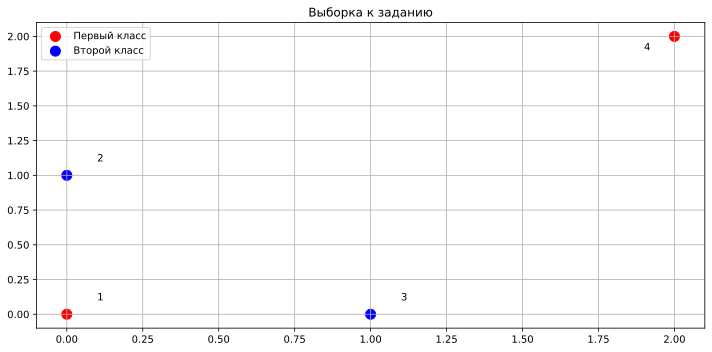

In [36]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.scatter([0, 2], [0, 2], s=100, c='r', label='Первый класс')
ax.scatter([0, 1], [1, 0], s=100, c='b', label='Второй класс')

ax.annotate('1', (0.1, 0.1))
ax.annotate('2', (0.1, 1.1))
ax.annotate('3', (1.1, 0.1))
ax.annotate('4', (1.9, 1.9))

ax.set_title('Выборка к заданию')
ax.grid(True)
ax.legend()

fig.tight_layout()
plt.show()

Для объекта   $i$<br>
Компактность: &nbsp; $s_i := \frac{1}{|\{j:\:C_j\:=\:C_i\}| - 1}\underset{j:\:C_j\:=\:C_i}{∑}||x_i\:-x_j||$ <br>
Отделимость: &nbsp; $d_i := \underset{C:C \neq C_i}{min}\frac{1}{|\{j:\:C_j\:=\:C_i\}| - 1}\underset{j:\:C_j\:=\:C_i}{∑}||x_i\:-x_j||$<br>
Силуэт: &nbsp;$sil_i = \frac{d_i - s_i}{max(d_i, s_i)}$<br>
Замечание: если кластер сосотоит из одного объекта, то его силуэт = 0<br>
Отсюда<br>
$s_1 = \frac{1}{1}*||(2, 2)^T - (0, 0)^T|| = 2\sqrt{2}$<br>
$s_4 = \frac{1}{1}*||(0, 0)^T - (2, 2)^T|| = s_1 = 2\sqrt{2}$<br>
$s_2 = \frac{1}{1}*||(0, 1)^T - (1, 0)^T|| = \sqrt{2}$<br>
$s_3 = \frac{1}{1}*||(1, 0)^T - (0, 1)^T|| = s_2 = \sqrt{2}$<br><br>
$d_1 = min\{\frac{1}{2}*(||(0, 0)^T - (0, 1)^T|| + ||(0, 0)^T - (1, 0)^T||)\} = \frac{1 + 1}{2}$<br>
$d_4 = min\{\frac{1}{2}*(||(2, 2)^T - (0, 1)^T|| + ||(2, 2)^T - (1, 0)^T||) \} = \frac{\sqrt{5} + \sqrt{5}}{2}$<br>
$d_2 = min\{\frac{1}{2}*(||(0, 1)^T - (0, 0)^T|| + ||(0, 1)^T - (2, 2)^T||) \} = \frac{1 + \sqrt{5}}{2}$<br>
$d_3 = min\{\frac{1}{2}*(||(1, 0)^T - (0, 0)^T|| + ||(1, 0)^T - (2, 2)^T||) \} = \frac{1 + \sqrt{5}}{2}$<br>
<br>
$sil_1 = \frac{1 - 2\sqrt2}{2\sqrt2} \approx -0.646446608$<br>
$sil_4 = \frac{\sqrt5 - 2\sqrt2}{2\sqrt2} \approx -0.2094305$<br><br>
$sil_2 = \frac{\frac{1 + \sqrt5}{2} - \sqrt2}{\frac{1 + \sqrt5}{2}} \approx 0.125967952$<br><br>
$sil_3 = \frac{\frac{1 + \sqrt5}{2} - \sqrt2}{\frac{1 + \sqrt5}{2}} \approx 0.125967952$<br><br>

Силуэт выборки X:&nbsp; $S = \frac{1}{|X|}\sum_isil_i$<br>
$S = 0.125967952 + 0.125967952 +(-0.646446608) + (-0.2094305)\approx -0.1509853 \approx -0.151$

<font color='magenta'>*Ваш ответ здесь:*</font> -0.151

In [37]:
print(silhouette_score(np.array([[0, 0.], [0, 1], [1, 0], [2, 2]]), np.array([1, 0, 0, 1])))

-0.15098532303997894


<a id='task_1.c.1'></a>
Убедитесь, что Ваша реализация проходит минимальные тесты:

In [38]:
assert np.allclose(
    silhouette_score(
        np.array([[0, 0.], [0, 1], [1, 0], [2, 2]]), np.array([1, 0, 0, 1])
    ),
    np.mean([-0.64644661,  0.12596795,  0.12596795, -0.20943058])
)

assert np.allclose(
    silhouette_score(
        np.array([[0, 0.], [0, 1], [1, 0], [2, 2], [1, 1], [2, 0]]), np.array([1, 0, 0, 1, 2, 2])
    ),
    np.mean([-0.64644661,  0.12596795, -0.29289322, -0.39644661, -0.29289322, 0.12596795])
)

### B-Cubed

Пусть существует разметка $(y_1, ... , y_l)$, не участвующая в обучении. Мы не использовали эту разметку в качестве дополнительного признака, так как нам не хочется мотивировать модель данным признаком. Тогда предлагается ввести оценку качества алгоритма кластеризации при помощи внешней разметки, саму же разметку тогда называют *gold standard*.

Один из вариантов учесть gold standard разметку — внешняя метрика B-Cubed. Данная метрика позволяет определять следующие особенности кластеризации:
1. **Гомогенность.** Базовое свойство разделения разных объектов в разные кластеры:




2. **Полнота.** Один кластер не должен дробиться на несколько маленьких:



3. **Rag-bag.** Весь мусор должен быть в одном "мусорном"кластере, чтобы остальные кластеры были "чистыми":



4. **Cluster size vs. quantity.** Лучше испортить один кластер с целью улучшить качество множества других:



Пусть $L(x)$ — gold standard, $C(x)$ — номер кластера, выдаваемый рассматриваемым алгоритмом.

Рассмотрим несколько величин:
$$
\text{Correctness}(x, x^{\prime}) = \begin{cases}
1 , C(x) = C(x^{\prime}) ∧ L(x) = L(x^{\prime})\\
0 , иначе
\end{cases}
$$
$$
\text{Precision-BCubed} = \underset{x}{\text{Avg}} \underset{x^{\prime}:C(x)=C(x^{\prime})}{\text{Avg}} \text{Correctness}(x, x^{\prime})
$$
$$
\text{Recall-BCubed} = \underset{x}{\text{Avg}} \underset{x^{\prime}:L(x)=L(x^{\prime})}{\text{Avg}} \text{Correctness}(x, x^{\prime})
$$

Тогда,
$$
\text{B-Cubed} = F_{1} = 2\frac{\text{Precision-BCubed}\times\text{Recall-BCubed}}{\text{Precision-BCubed}+\text{Recall-BCubed}}
$$

#### <font color='orange'>**Задание 1.с.3 [unittests, 8 баллов]**</font>
Реализуйте вычисление метрики B-Cubed. Подробная спецификация и описание входных данных к тестам указаны в **описании задания**.

При реализации обратите внимание на следующие пункты:
1. При вычислении не должно возникать warning, бесконечностей и nan-ов.
2. Использование циклов запрещено
3. Обратите внимание на параметр `where` у функций-агрегаторов в `numpy` ($numpy \geq 1.20.0$).
4. Запрещено использовать любые библиотечные реализации B-Cubed.

**Входные данные тестов удовлетворяют одному из следующих ограничений:**
1. Число объектов n ⩽ 1000, число подтестов в одном тесте T ⩽ 70

**Несколько важных замечаний:**

**Замечание:** Запрещается пользоваться библиотеками, импорт которых не объявлен в файле с шаблонами функций.

**Замечание:** Задания, в которых есть решения, содержащие в каком-либо виде взлом тестов, дополнительные импорты и прочие нечестные приемы, будут автоматически оценены в $0$ баллов без права пересдачи задания.

**Замечание:** Под циклами далее подразумеваются как явные Python-циклы (`for`, `while`, list comprehension, ...), так и неявное использование таких циклов внутри библиотек (`np.apply_along_axis` и подобные). В случае возникновения ошибки **Time limit** проверьте код на соответствие числа используемых циклов с требованиями к реализации.

**Замечание:** Для самопроверки доступны как публичные тесты (смотрите **описание задания**), так и тесты внутри Jupyter Notebook (смотрите [**тесты для B-Cubed**](#task_1.c.3)).

In [39]:
def bcubed_score(real, pred):
    '''
    :param np.ndarray true_labels: Непустой одномерный массив меток объектов
    :param np.ndarray predicted_labels: Непустой одномерный массив меток объектов
    :return float: B-Cubed для объектов с истинными метками true_labels и предсказанными метками predicted_labels
    '''
    eq_C = pred[:, np.newaxis] == pred
    eq_L = real[:, np.newaxis] == real
    corr = eq_C * eq_L
    prec = eq_C * corr
    prec = np.mean(np.mean(prec, axis=1, where=eq_C))
    rec = eq_L * corr
    rec = np.mean(np.mean(rec, axis=1, where=eq_L))
    return 2 * rec * prec / (prec + rec)

<a id='task_1.c.3'></a>
Убедитесь, что Ваша реализация проходит минимальные тесты:

In [40]:
assert np.allclose(bcubed_score(np.array([1]), np.array([1])), 1.0)
assert np.allclose(bcubed_score(np.array([1]), np.array([2])), 1.0)
assert np.allclose(bcubed_score(np.array([1, 2]), np.array([1, 1])), 2. / 3)
assert np.allclose(bcubed_score(np.array([1, 2]), np.array([1, 2])), 1.0)
assert np.allclose(bcubed_score(np.array([1, 2]), np.array([43, 12])), 1.0)
assert np.allclose(bcubed_score(np.array([1, 1, 2, 2]), np.array([1, 1, 1, 2])), 12. / 17)
assert np.allclose(bcubed_score(np.array([1, 2, 3, 4, 5]), np.array([1, 1, 1, 2, 2])), 4. / 7)

#### <font color='orange'>**Задание 1.с.4 [кросспроверка, 4 балла][код, вопрос]** </font>
<a id='task_1.c.4'></a>
* Для каждого из трёх алгоритмов кластеризации переберите основные параметры (`n_clusters`, `eps`, `min_samples`) и замерьте качество кластеризации многомерных данных с помощью коэффициента силуэта и метрики B-Cubed.
* Для каждого из алгоритмов на одной фигуре изобразите четыре графика — в первой строке два графика с зависимостью коэффициента силуэта и метрики B-Cubed от варьируемого параметра. Во второй строке — визуализация кластеризации с оптимальным параметром, выбранным с помощью первой и второй метрики (можете использовать `plot_2d_data` с параметром `ax`). Для DBSCAN перебирайте оба параметра одновременно и изобразите 2d-heatmap для каждой из метрик. Можете использовать [вспомогательные функции для создания heatmap](https://matplotlib.org/stable/gallery/images_contours_and_fields/image_annotated_heatmap.html).
* Совпали ли оптимальные параметры, определённые по этим метрикам? Совпали ли они с теми параметрами которые вы подобрали в предыдущем задании? Предположите почему они совпали/не совпали.
* Можно ли использовать данные метрики для оценки кластеризации между разными алгоритмами? Какая из них лучше отражает качество?

In [41]:
from hyperopt import hp, fmin, tpe, Trials  # Forget it
from sklearn.model_selection import GridSearchCV  # Forget it

In [42]:
scaler = StandardScaler()
data_transformed = scaler.fit_transform(data)

In [43]:
sil_scores = []
bcubed_scores = []

for n in range(1, 100 + 1):
    model = KMeans(n_clusters=n, n_init='auto', random_state=42)
    labels_pred = model.fit_predict(data_transformed)
    sil_scores.append(silhouette_score(data_transformed, labels_pred))
    bcubed_scores.append(bcubed_score(labels, labels_pred))

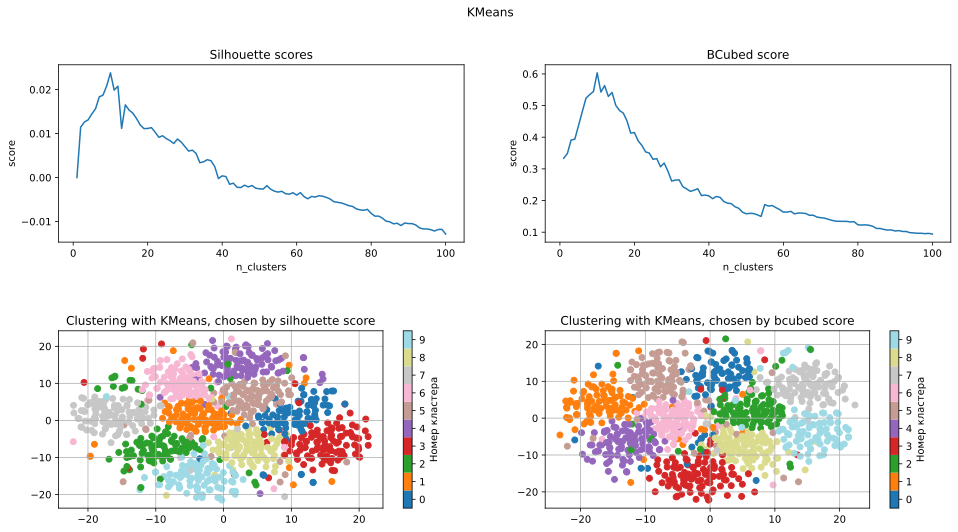

In [44]:
# plot_2d_data(data, labels, title=f'KMeans with K={n_clust}, random_state={state}', cmap='tab20', ax=None)
trans = TSNE()
model = KMeans(n_clusters=n, n_init='auto', random_state=42)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 8))
plt.subplots_adjust(hspace=0.5)

plt.suptitle('KMeans')
axes[0, 0].set_title('Silhouette scores')
axes[0, 0].set_xlabel('n_clusters')
axes[0, 0].set_ylabel('score')
axes[0, 1].set_title('BCubed score')
axes[0, 1].set_xlabel('n_clusters')
axes[0, 1].set_ylabel('score')
axes[0, 0].plot(range(1, 101), sil_scores)
axes[0, 1].plot(range(1, 101), bcubed_scores)

axes[1, 1].set_title('Clustering with KMeans, chosen by bcubed score')
model.set_params(n_clusters=(np.argmax(bcubed_scores) + 1))
plot_2d_data(trans.fit_transform(data_transformed), model.fit_predict(data_transformed), ax=axes[1, 1])
axes[1, 1].set_title('Clustering with KMeans, chosen by bcubed score')

model.set_params(n_clusters=(np.argmax(sil_scores) + 1))
plot_2d_data(trans.fit_transform(data_transformed), model.fit_predict(data_transformed), ax=axes[1, 0])
axes[1, 0].set_title('Clustering with KMeans, chosen by silhouette score')
plt.show()

In [45]:
print(f'Best "n_clusters - silhouette score": {np.argmax(sil_scores) + 1, sil_scores[np.argmax(sil_scores)]}')
print(f'Best "n_clusters - bcubed score": {np.argmax(bcubed_scores) + 1, bcubed_scores[np.argmax(bcubed_scores)]}')

Best "n_clusters - silhouette score": (10, 0.02381537353952631)
Best "n_clusters - bcubed score": (10, 0.6033706609140927)


In [46]:
model = KMeans(n_clusters=5, n_init='auto', random_state=42)
real = labels
pred = model.fit_predict(data_transformed)
eq_C = pred[:, np.newaxis] == pred
eq_L = real[:, np.newaxis] == real
corr = eq_C * eq_L
prec = eq_C * corr
prec = np.mean(np.mean(prec, axis=1, where=eq_C))
print('Precision:', prec)
rec = eq_L * corr
rec = np.mean(np.mean(rec, axis=1, where=eq_L))
print('Recall:', rec)

Precision: 0.4337556945139742
Recall: 0.4403910153184422


In [47]:
model = KMeans(n_clusters=10, n_init='auto', random_state=42)
real = labels
pred = model.fit_predict(data_transformed)
eq_C = pred[:, np.newaxis] == pred
eq_L = real[:, np.newaxis] == real
corr = eq_C * eq_L
prec = eq_C * corr
prec = np.mean(np.mean(prec, axis=1, where=eq_C))
print('Precision:', prec)
rec = eq_L * corr
rec = np.mean(np.mean(rec, axis=1, where=eq_L))
print('Recall:', rec)

Precision: 0.9051667777275964
Recall: 0.4525003041809599


Запомнили recall и precision для выводов

In [48]:
sil_scores = []
bcubed_scores = []

for n in range(1, 100 + 1):
    model = AgglomerativeClustering(n_clusters=n)
    labels_pred = model.fit_predict(data_transformed)
    sil_scores.append(silhouette_score(data_transformed, labels_pred))
    bcubed_scores.append(bcubed_score(labels, labels_pred))

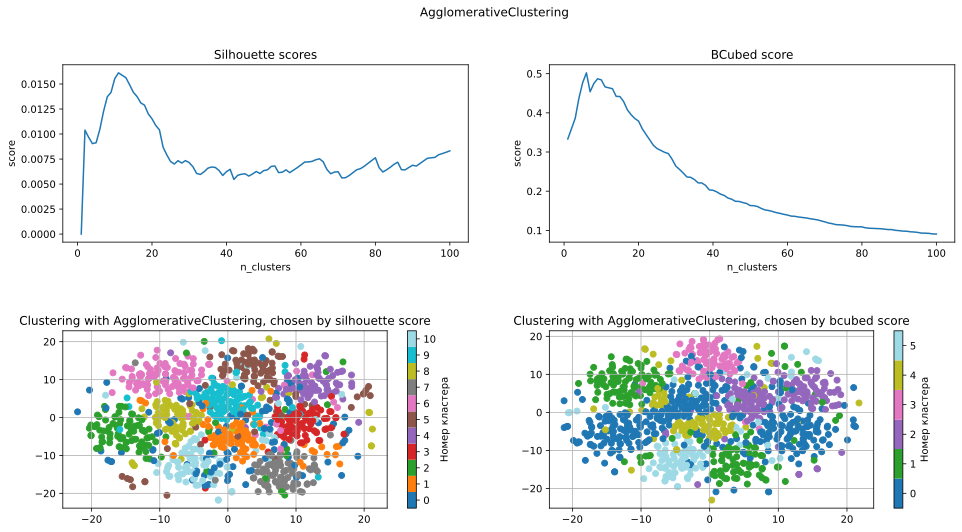

In [49]:
trans = TSNE()
model = AgglomerativeClustering()
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 8))
plt.subplots_adjust(hspace=0.5)

plt.suptitle('AgglomerativeClustering')
axes[0, 0].set_title('Silhouette scores')
axes[0, 0].set_xlabel('n_clusters')
axes[0, 0].set_ylabel('score')
axes[0, 1].set_title('BCubed score')
axes[0, 1].set_xlabel('n_clusters')
axes[0, 1].set_ylabel('score')
axes[0, 0].plot(range(1, 101), sil_scores)
axes[0, 1].plot(range(1, 101), bcubed_scores)

axes[1, 1].set_title('Clustering with AgglomerativeClustering, chosen by bcubed score')
model.set_params(n_clusters=(np.argmax(bcubed_scores) + 1))
plot_2d_data(trans.fit_transform(data_transformed), model.fit_predict(data_transformed), ax=axes[1, 1])
axes[1, 1].set_title('Clustering with AgglomerativeClustering, chosen by bcubed score')

model.set_params(n_clusters=(np.argmax(sil_scores) + 1))
plot_2d_data(trans.fit_transform(data_transformed), model.fit_predict(data_transformed), ax=axes[1, 0])
axes[1, 0].set_title('Clustering with AgglomerativeClustering, chosen by silhouette score')
plt.show()

In [50]:
print(f'Best "n_clusters - silhouette score": {np.argmax(sil_scores) + 1, sil_scores[np.argmax(sil_scores)]}')
print(f'Best "n_clusters - bcubed score": {np.argmax(bcubed_scores) + 1, bcubed_scores[np.argmax(bcubed_scores)]}')

Best "n_clusters - silhouette score": (11, 0.016117980884831674)
Best "n_clusters - bcubed score": (6, 0.5021535012876015)


In [51]:
space = {
    'eps': hp.uniform('eps', 15, 20),
    'min_samples': hp.randint('min_samples', 1, 101),
}

def objective(params):
    model = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
    labels_pred = model.fit_predict(data_transformed)
    return -silhouette_score(data_transformed, labels_pred)

# Perform hyperparameter optimization with nested cross-validation
trials = Trials()
best_params = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=1000, trials=trials)

print("Best hyperparameters:", best_params)

100%|██████████| 1000/1000 [02:50<00:00,  5.86trial/s, best loss: -0.09087604741524001]
Best hyperparameters: {'eps': 18.830111468301546, 'min_samples': 58}


In [52]:
model = DBSCAN(eps=best_params['eps'], min_samples=best_params['min_samples'])
labels_pred = model.fit_predict(data_transformed)
print(silhouette_score(data_transformed, labels_pred))

0.09087604741524001


In [53]:
params = [trial['misc']['vals'] for trial in trials.trials]
params_eps = [param['eps'] for param in params]
params_ms = [param['min_samples'] for param in params]
scores = [-trial['result']['loss'] for trial in trials]

Это будет не совсем хитмап, но лучше я ничего не придумал. Это, кажется, оптимальный вариант

In [54]:
space = {
    'eps': hp.uniform('eps', 15, 20),
    'min_samples': hp.randint('min_samples', 1, 101),
}

def objective(params):
    model = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
    labels_pred = model.fit_predict(data_transformed)
    return -bcubed_score(labels, labels_pred)

# Perform hyperparameter optimization with nested cross-validation
trials1 = Trials()
best_params1 = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=1000, trials=trials1)

print("Best hyperparameters:", best_params1)

100%|██████████| 1000/1000 [00:51<00:00, 19.39trial/s, best loss: -0.46926352516384645]
Best hyperparameters: {'eps': 17.20045064403473, 'min_samples': 1}


In [55]:
model = DBSCAN(eps=best_params1['eps'], min_samples=best_params1['min_samples'])
labels_pred = model.fit_predict(data_transformed)
print(bcubed_score(labels, labels_pred))
eq_C = pred[:, np.newaxis] == pred
eq_L = real[:, np.newaxis] == real
corr = eq_C * eq_L
prec = eq_C * corr
prec = np.mean(np.mean(prec, axis=1, where=eq_C))
rec = eq_L * corr
rec = np.mean(np.mean(rec, axis=1, where=eq_L))
print('Recall: ', rec)
print('Precision: ', prec)

0.46926352516384645
Recall:  0.4525003041809599
Precision:  0.9051667777275964


In [56]:
params1 = [trial['misc']['vals'] for trial in trials1.trials]
params_eps1 = [param['eps'] for param in params1]
params_ms1 = [param['min_samples'] for param in params1]
scores1 = [-trial['result']['loss'] for trial in trials1]

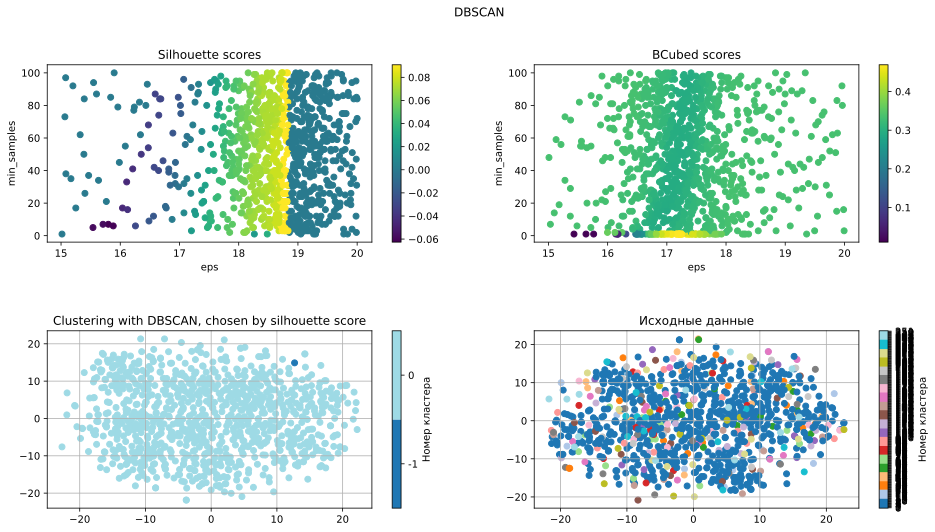

In [57]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 8))
plt.subplots_adjust(hspace=0.5)
plt.suptitle('DBSCAN')
trans = TSNE()
model = DBSCAN()

axes[0, 0].set_title('Silhouette scores')
axes[0, 0].set_ylabel('min_samples')
axes[0, 0].set_xlabel('eps')
pl = axes[0, 0].scatter(params_eps, params_ms, c=scores)
plt.colorbar(pl, ax=axes[0, 0])

axes[0, 1].set_title('BCubed scores')
axes[0, 1].set_ylabel('min_samples')
axes[0, 1].set_xlabel('eps')
pl = axes[0, 1].scatter(params_eps1, params_ms1, c=scores1)
plt.colorbar(pl, ax=axes[0, 1])

axes[1, 1].set_title('Clustering with DBSCAN, chosen by bcubed score')
model.set_params(min_samples=best_params1['min_samples'], eps=best_params1['eps'])
plot_2d_data(trans.fit_transform(data_transformed), model.fit_predict(data_transformed), ax=axes[1, 1])

model.set_params(min_samples=best_params['min_samples'], eps=best_params['eps'])
plot_2d_data(trans.fit_transform(data_transformed), model.fit_predict(data_transformed), ax=axes[1, 0])
axes[1, 0].set_title('Clustering with DBSCAN, chosen by silhouette score')
plt.show()

plt.show()

<font color='magenta'>*Ваш ответ здесь:*</font> DBSCAN полностью зафейлил задачу. Причину я указал в выводах выше. Данные большой размерности - просто не для него. Хотя номеров кластеров не видно на диаграммах, видно, что ДБСКАН примерно выделил самые плотные части кластеров (ядра) (это видно по необычно высокой метрике recall - т.е. он не выбирает случайные кластеры по одному элементу), оставив весь "мусор" в отдельном кластере (метка синего кластера = -1, т.е. мусор)<br>
AgglomerativeClustering подобрал 10 кластеров по силуэту, что почти полностью соответствует исходным данным (там 5 классов по 2 кластера, т.е. почти то же, что 10 кластеров), засунув мусор в 11-й кластер (см "rag-bag"). По bcubed иерархический кластеринг смог найти оригинальные 5 кластеров, выкинув мусор в отдельный 6й кластер. Это лучший результат из всех алгоритмов и метрик.<br>
KMeans в зависимости от инициализации может выделить 10 кластеров, а может засунуть "мусор" в отдельный, 11й кластер. Но в целом он выделяет 10 кластеров по силуэту. По bcubed он выделяет 10 кластеров (может выделить отдельный мусорный). Это ВАЖНО! ОБРАТИТЕ ВНИМАНИЕ на recall в случае, когда даем KMeans оригинальное число кластеров - 5 и когда даем 10 кластеров. Они не отличаются и находятся на уровне 0.5. Это значит, что при бросании 5 центроидов на пространство он выбирает совершенно случайным образом 2 кластера. Это происходит из-за того, что оригинальные данные находятся в вершинах гиперкуба + портит ситуацию большая размерность. У AgglomerativeClustering такой проблемы нет (см. recall на уровне 0.8 в случае подбора по bcubed). <br>
<br>
Нет большого смысла в сравнении алгоритмов по силуэту. DBSCAN получил наилучший силуэт среди алгоритмов, выделив один кластер и засунув несколько объектов в мусор, что никак не соответствует оригинальным данным. <br>
При этом bcubed более универсальна. Можно смело с помощью нее сравнивать различные алгоритмы.
<br>
Ответ, данный алгоритмами, не совпал с полученными вручную ответами, т.к. при отборе вручную не было ясно, когда стоит включать дополнительный кластер для мусора, а когда нет

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

# <font color='orange'>2. Кластеризация "естественных" данных.   [кросспроверка 22 балла]</font>

Синтетические данные имеют достаточно простую структуру, поэтому методы снижения размерности позволяют получать хорошее низкоразмерное представление с достаточно выраженными кластерами. Однако, реальные данные могут быть устроены существенно сложнее. Посмотрим как поведут себя методы снижения размерности на датасете с картинками CIFAR10.

Загрузим датасет. Будем использовать только часть обучающей выборки, чтобы ускорить вычисления на высокоразмерных данных.

In [58]:
cifar10_test_dataset = CIFAR10('./cifar10', train=False, download=True)
cifar10_train_dataset = CIFAR10('./cifar10', train=True, download=False)

cifar10_labels_test = np.array(cifar10_test_dataset.targets)
cifar10_labels_train = np.array(cifar10_train_dataset.targets)

cifar10_images_test = cifar10_test_dataset.data
cifar10_images_train = cifar10_train_dataset.data

cifar10_images_train, _, cifar10_labels_train, _ = train_test_split(
    cifar10_images_train, cifar10_labels_train,
    train_size=cifar10_images_test.shape[0], stratify=cifar10_labels_train, random_state=6886
)

cifar10_data_test = (cifar10_images_test.astype(np.float32) / 255.0).reshape([cifar10_images_test.shape[0], -1])
cifar10_data_train = (cifar10_images_train.astype(np.float32) / 255.0).reshape([cifar10_images_train.shape[0], -1])

100%|██████████| 170498071/170498071 [00:01<00:00, 89650223.98it/s]


Extracting ./cifar10/cifar-10-python.tar.gz to ./cifar10


Отобразим данные в проекции на две случайные оси. Для удобства воспользуемся здесь ещё одним вариантом динамического контента в jupyter notebook — при наведении на точку на графике будем отображать исходную картинку.

In [59]:
def plot_interactive(lowd_data, images, labels, names, n_dots=1000, image_scale=1.0):
    with matplotlib.rc_context(rc={
        'font.size': image_scale * matplotlib.rcParams['font.size'],
        'xtick.major.size': image_scale * matplotlib.rcParams['xtick.major.size'],
        'xtick.minor.size': image_scale * matplotlib.rcParams['xtick.minor.size'],
        'ytick.major.size': image_scale * matplotlib.rcParams['ytick.major.size'],
        'ytick.minor.size': image_scale * matplotlib.rcParams['ytick.minor.size'],

        'axes.linewidth': image_scale * matplotlib.rcParams['axes.linewidth'],
        'grid.linewidth': image_scale * matplotlib.rcParams['grid.linewidth'],
        'patch.linewidth': image_scale * matplotlib.rcParams['patch.linewidth'],
        'xtick.major.width': image_scale * matplotlib.rcParams['xtick.major.width'],
        'xtick.minor.width': image_scale * matplotlib.rcParams['xtick.minor.width'],
        'ytick.major.width': image_scale * matplotlib.rcParams['ytick.major.width'],
        'ytick.minor.width': image_scale * matplotlib.rcParams['ytick.minor.width'],

        'lines.markeredgewidth': image_scale * matplotlib.rcParams['lines.markeredgewidth'],
    }):
        fig, ax = plt.subplots(1, 1, figsize=(image_scale * 10, image_scale * 5))
        fig.set_dpi(300)
        ax.grid(True)

        n_clusters = len(np.unique(labels))

        scatter = plt.scatter(
            lowd_data[:n_dots, 0], lowd_data[:n_dots, 1], s=image_scale * 10,
            c=labels[:n_dots], cmap=plt.get_cmap('tab20', n_clusters), edgecolors='none'
        )

        cbar = plt.colorbar(scatter, ax=ax, label='Название кластера')
        cbar.set_ticks(np.min(labels[:n_dots]) + (np.arange(n_clusters) + 0.5) * (n_clusters - 1) / n_clusters)
        cbar.set_ticklabels(names)

        offset_image = OffsetImage(images[0], zoom=image_scale * 2.0)
        ann_bbox = AnnotationBbox(
            offset_image, (0,0), xybox=(image_scale * 50., image_scale * 50.), xycoords='data',
            boxcoords="offset points", pad=0.3, arrowprops=dict(
                arrowstyle='->, head_length={0:.2f}, head_width={1:.2f}'.format(
                    image_scale * 0.4, image_scale * 0.2
                )
            )
        )
        ax.add_artist(ann_bbox)
        ax.set_title('Распределение данных CIFAR10 в проекции на 2 случайные оси')
        ann_bbox.set_visible(False)

        def image_hover(event):
            if scatter.contains(event)[0]:
                ind, *_ = scatter.contains(event)[1]["ind"]
                w, h = fig.get_size_inches() * fig.dpi
                ws = (event.x > w / 2.) * -1 + (event.x <= w / 2.)
                hs = (event.y > h / 2.) * -1 + (event.y <= h / 2.)
                ann_bbox.xybox = (image_scale * 50.0 * ws, image_scale * 50.0 * hs)
                ann_bbox.set_visible(True)
                ann_bbox.xy =(lowd_data[ind, 0], lowd_data[ind, 1])
                offset_image.set_data(images[ind])
            else:
                ann_bbox.set_visible(False)
            fig.canvas.draw_idle()

        fig.canvas.mpl_connect('motion_notify_event', image_hover)

        plt.show()

In [60]:
%matplotlib ipympl
matplotlib.rcParams['figure.dpi'] = 300

# Для работы в Google Colab нужно выполнить специфичную магию
# Обычно, она не срабатывает с первого раза, поэтому может потребоваться
#   несколько раз выполнить ячейку и несколько раз попробовать нарисовать график
try:
    from google.colab import output
    output.enable_custom_widget_manager()
except:
    pass

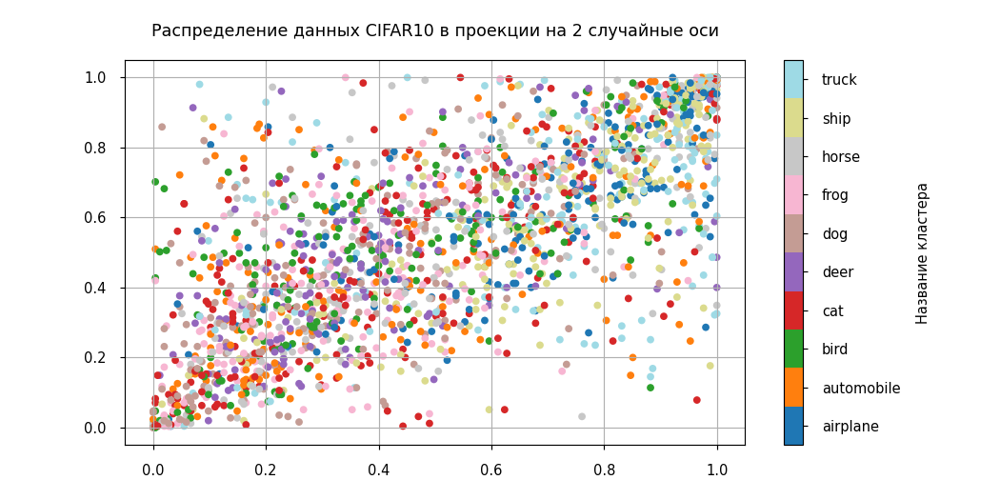

In [61]:
# Если картинка окажется слишком маленькой/большой, то поменяйте image_scale на подходящее значение
plot_interactive(
    cifar10_data_train[:, [17, 64]], cifar10_images_train, cifar10_labels_train,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=0.35
)

Вернёмся в статичный режим отрисовки изображений:

In [62]:
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 100

#### <font color='orange'>**Задание 2.1 [кросспроверка, 2 балла][код]**
<a id='task_2.1'></a></font>
Воспользуйтесь алгоритмами снижения размерности `TSNE`, `UMAP`, `Isomap`, `KernelPCA` для визуализации картинок.

Постройте визуализацию низкоразмерного представления, полученного с помощью этих моделей — изобразите четыре графика в одной строке. Во второй строке отобразите результат применения обученных моделей на тестовой выборке. Если для данного алгоритма невозможно сделать предсказания на тестовой выборке — оставьте соответствующий график пустым. Обозначьте разными цветами разные классы объектов. Для повышения производительности можете отобразить только часть выборки на графике ($1000\text{-}2000$ объектов).

*Замечание:* обратите внимание, что все алгоритмы снижения размерности также требуют правильного масштабирования признаков, для корректной работы и интерпретируемых результатов.

In [75]:
def plot_im(ax, title, lowd_data, labels, names, n_dots=1000, image_scale=1.0):
    ax.grid(True)
    n_clusters = len(np.unique(labels))
    scatter = ax.scatter(
        lowd_data[:n_dots, 0], lowd_data[:n_dots, 1], s=image_scale * 10,
        c=labels[:n_dots], cmap=plt.get_cmap('tab20', n_clusters), edgecolors='none'
    )
    ax.set_title(title)
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_ticks(np.min(labels[:n_dots]) + (np.arange(n_clusters) + 0.5) * (n_clusters - 1) / n_clusters)
    cbar.set_ticklabels(names)

In [91]:
scaler = StandardScaler()

In [92]:
new_data1 = scaler.fit_transform(cifar10_data_train)
trans1 = TSNE()
new_data1 = trans1.fit_transform(new_data1)

In [93]:
new_data2 = scaler.fit_transform(cifar10_data_train)
trans2 = UMAP()
new_data3 = trans2.fit_transform(new_data2)

In [94]:
new_data3 = scaler.fit_transform(cifar10_data_train)
trans3 = Isomap()
new_data3 = trans3.fit_transform(new_data3)

In [95]:
new_data4 = scaler.fit_transform(cifar10_data_train)
trans4 = KernelPCA()
new_data4 = trans4.fit_transform(new_data4)

In [96]:
test_data2 = scaler.fit_transform(cifar10_data_test)
test_data2 = trans2.transform(test_data2)

In [97]:
test_data3 = scaler.fit_transform(cifar10_data_test)
test_data3 = trans3.transform(test_data3)

In [98]:
test_data4 = scaler.fit_transform(cifar10_data_test)
test_data4 = trans4.transform(test_data4)

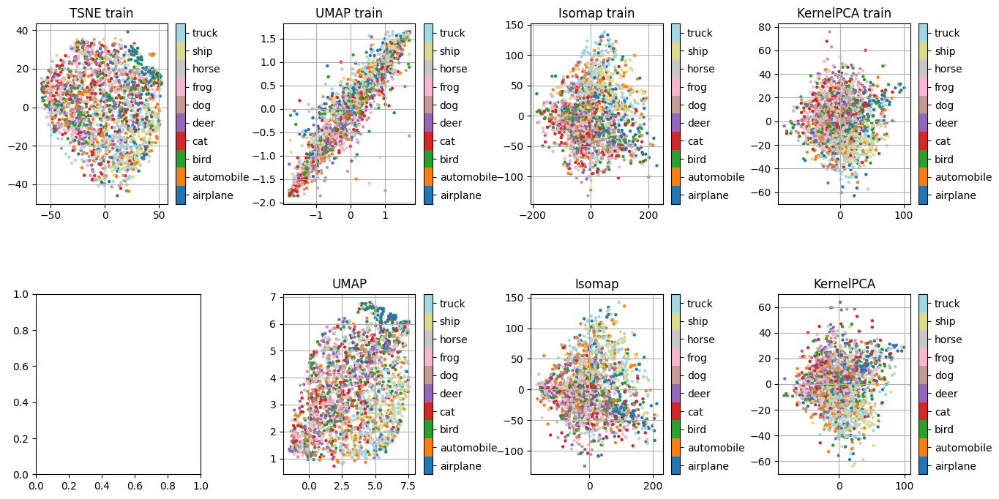

In [99]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 8))
plt.subplots_adjust(hspace=0.5, wspace=0.5)
plot_im(
    axes[0, 0], 'TSNE train',
    new_data1, cifar10_labels_train,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=1
)
plot_im(
    axes[0, 1], 'UMAP train',
    new_data2, cifar10_labels_train,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=1
)
plot_im(
    axes[0, 2], 'Isomap train',
    new_data3, cifar10_labels_train,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=1
)
plot_im(
    axes[0, 3], 'KernelPCA train',
    new_data4, cifar10_labels_train,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=1
)

plot_im(
    axes[1, 1], 'UMAP',
    test_data2, cifar10_labels_test,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=1
)
plot_im(
    axes[1, 2], 'Isomap',
    test_data3, cifar10_labels_test,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=1
)
plot_im(
    axes[1, 3], 'KernelPCA',
    test_data4, cifar10_labels_test,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=1
)
plt.show()

#### <font color='orange'>**Задание 2.2 [кросспроверка, 3 балла][вопрос]**</font>
Опишите увиденное. Почему алгоритмы могли отработать не так, как вы ожидали?

<font color='magenta'>*Ваш ответ здесь:*</font> (ｏ・_・)ノ”(ノ_<、)<br>
Я увидел то, что ожидал. Явно выраженных кластеров в проекциях на 2 оси, полученных с помощью методов понижения размерности, не видно. Если в примере с синтетическими 5 классами по 2 кластера истинная размерность была 100, а данные были представлены явно выраженными кластерами, то здесь данные устроены сложно. Истинная размерность больше - 32x32, а кластеры неоднородны, перемешаны. <br>

#### <font color='orange'>**Задание 2.3 [кросспроверка, 2 балла][вопрос]**</font>
Методы снижения размерности, как и другие метрические методы испытывают трудности при работе с данными высокой размерности. Напишите как минимум две причины, почему.

<font color='magenta'>*Ваш ответ здесь:*</font> <br>
1. Очень сильный разброс данных<br>
2. Сильное перемешивание кластеров (в частности, неотличимость по отдельным признакам)
3. Следует из 1: некомпактность кластеров

Один из способов решения этих проблем — перейти в другое, более репрезентативное пространство признаков, где объекты будут расположены в многообразии, которое легче представить в двумерном пространстве. Чтобы выполнить такое преобразование воспользуемся типичным подходом **Transfer Learning** — предобученными нейронными сетями. С помощью глубокой сети обученной на другом наборе изображений (`ImageNet`) мы перейдём в новое векторное пространство и затем применим методы снижения размерности.

Так как локальный подсчёт эмбеддингов изображений может занять много времени, Вы можете попробовать скачать их из [проверяющей системы](https://cv-gml.ru/), или через `gdown`:

#### <font color='orange'>**Задание 2.4 [кросспроверка, 4 балла][код]**</font>
Используйте выделенные признаки для обучения алгоритмов из предыдущего пункта. Постройте графики. Замечание из пункта [**2.1**](#task_2.1) остаётся в силе.

In [87]:
gdown.download(id='16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-', output='cifar10_deep_features.npy')

Downloading...
From (original): https://drive.google.com/uc?id=16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-
From (redirected): https://drive.google.com/uc?id=16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-&confirm=t&uuid=c548cafb-c0c5-493c-845c-9cff2f2a6f49
To: /content/cifar10_deep_features.npy
100%|██████████| 164M/164M [00:00<00:00, 211MB/s]


'cifar10_deep_features.npy'

In [88]:
FEATURES_PATH = './cifar10_deep_features.npy'

if not os.path.exists(FEATURES_PATH):
    deep_cnn = InceptionV3(weights='imagenet', include_top=False, input_shape=(139, 139, 3))

    cifar10_tensors_test = torch.nn.functional.interpolate(torch.tensor(
        cifar10_images_test.transpose(0, 3, 1, 2)
    ), size=139).numpy().transpose(0, 2, 3, 1).astype(np.float32)
    cifar10_tensors_train = torch.nn.functional.interpolate(torch.tensor(
        cifar10_images_train.transpose(0, 3, 1, 2)
    ), size=139).numpy().transpose(0, 2, 3, 1).astype(np.float32)

    cifar10_deep_features_test = deep_cnn.predict(
        preprocess_input(cifar10_tensors_test)
    ).mean(axis=(1, 2)).reshape([cifar10_tensors_test.shape[0], -1])
    cifar10_deep_features_train = deep_cnn.predict(
        preprocess_input(cifar10_tensors_train)
    ).mean(axis=(1, 2)).reshape([cifar10_tensors_train.shape[0], -1])

    np.save(FEATURES_PATH, [cifar10_deep_features_test, cifar10_deep_features_train])
else:
    cifar10_deep_features_test, cifar10_deep_features_train = np.load(FEATURES_PATH, allow_pickle=True)

In [100]:
scaler = StandardScaler()

In [101]:
new_data1 = scaler.fit_transform(cifar10_deep_features_train)
trans1 = TSNE()
new_data1 = trans1.fit_transform(new_data1)

In [109]:
new_data2 = scaler.fit_transform(cifar10_deep_features_train)
trans2 = UMAP()
new_data2 = trans2.fit_transform(new_data2)

In [103]:
new_data3 = scaler.fit_transform(cifar10_deep_features_train)
trans3 = Isomap()
new_data3 = trans3.fit_transform(new_data3)

In [104]:
new_data4 = scaler.fit_transform(cifar10_deep_features_train)
trans4 = KernelPCA()
new_data4 = trans4.fit_transform(new_data4)

In [105]:
test_data2 = scaler.fit_transform(cifar10_deep_features_test)
test_data2 = trans2.transform(test_data2)

In [106]:
test_data3 = scaler.fit_transform(cifar10_deep_features_test)
test_data3 = trans3.transform(test_data3)

In [107]:
test_data4 = scaler.fit_transform(cifar10_deep_features_test)
test_data4 = trans4.transform(test_data4)

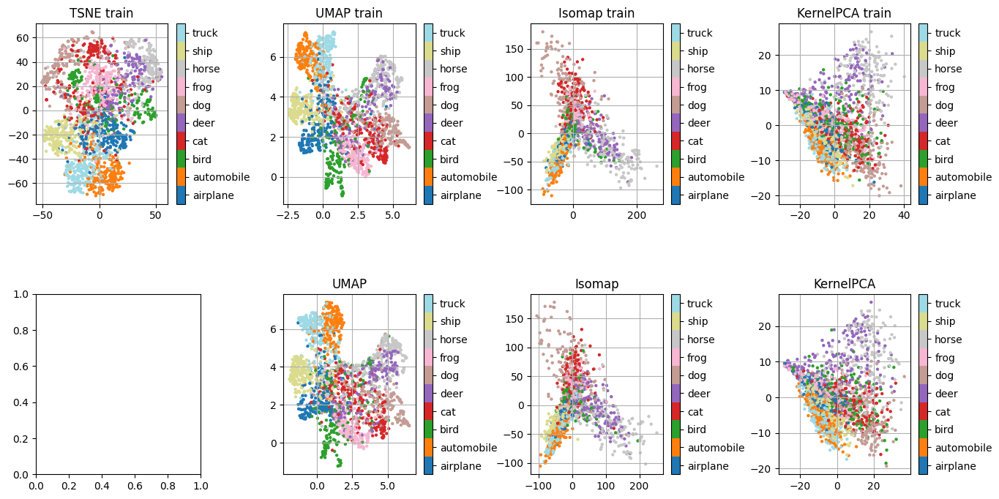

In [110]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 8))
plt.subplots_adjust(hspace=0.5, wspace=0.5)
plot_im(
    axes[0, 0], 'TSNE train',
    new_data1, cifar10_labels_train,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=1
)
plot_im(
    axes[0, 1], 'UMAP train',
    new_data2, cifar10_labels_train,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=1
)
plot_im(
    axes[0, 2], 'Isomap train',
    new_data3, cifar10_labels_train,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=1
)
plot_im(
    axes[0, 3], 'KernelPCA train',
    new_data4, cifar10_labels_train,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=1
)

plot_im(
    axes[1, 1], 'UMAP',
    test_data2, cifar10_labels_test,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=1
)
plot_im(
    axes[1, 2], 'Isomap',
    test_data3, cifar10_labels_test,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=1
)
plot_im(
    axes[1, 3], 'KernelPCA',
    test_data4, cifar10_labels_test,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=1
)
plt.show()

#### <font color='orange'>**Задание 2.5 [кросспроверка, 3 балла][вопрос]**</font>
1. Есть ли какие-то изменения по сравнению с использованием исходных признаков?
2. Как вы думаете, почему использование глубоких признаков помогло/не помогло в задаче снижения размерности?
3. Какой алгоритм показал себя лучше на ваш взгляд?
4. Согласованы ли преобразования на обучающей и тестовых выборках? Какие недостатки есть в том, что преобразование на тестовой выборке выглядит отлично от низкоразмерного представления обучающей выборки?
5. Какие из алгоритмов можно использовать в качестве первого шага по снижению размерности в задачах машинного обучения? Какой из них использовали бы вы?

<font color='magenta'>*Ваш ответ здесь:*</font> (ｏ・_・)ノ”(ノ_<、)<br>
1. Да, изменения есть. Видно четкие кластеры. <br>
2. Глубокие сети способны обнаруживать более сложные зависимости, чем те, которые способны восстановить описанные ранее алгоритмы понижения размерности сами по себе. Глубокие сети хороши в задачах с большой размерностью (эмбеддинги)<br>
3. TSNE на тренировочной выборке явно хорошо разделил данные. Видно, что он немного лучше UMAP. Но UMAP также хорошо справился с задачей понижения размерности.<br>
4. Да, преобразования обучающей и тестовой выборок в целом согласованы, хоят отличия имеются. Недостаток, например, в том, что нельзя работать с тестовой и тренировочной выборкой в одном и том же низкоразмерном пространстве, т.к. это способно привести к неверным выводам. <br>
5. Точно не PCA, т.к. он работал долго и не принес желаемых результатов. Не Айзомэп, т.к. он показал результат хуже ТСНЕ и ЮМАП. А вот TSNE и UMAP я бы использовал в качестве алгоритмов для сниженяи размерности в этой задаче. Если бы я выбрал один, то это был бы скорее TSNE

Далее, для визуализации кластеризации используйте один из методов снижения размерности на ваш выбор и то векторное представление, которое лучше всего себя проявило (исходное или полученное с помощью глубокой сети). Кластеризацию обучайте также на наиболее подходящем высокоразмерном векторном представлении.

#### <font color='orange'>**Задание 2.6 [кросспроверка, 2 балла][код, вопрос]**</font>
Изобразите выборку CIFAR10 с помощью выбранного алгоритма снижения размерности.

*Совет*: Изобразите результат с помощью `plot_interactive`, чтобы изучить особенности кластеризации в соответствии с исходными изображениями. Если вы нашли интересные особенности — напишите про это.

In [111]:
%matplotlib ipympl
matplotlib.rcParams['figure.dpi'] = 300

# Для работы в Google Colab нужно выполнить специфичную магию
# Обычно, она не срабатывает с первого раза, поэтому может потребоваться
#   несколько раз выполнить ячейку и несколько раз попробовать нарисовать график
try:
    from google.colab import output
    output.enable_custom_widget_manager()
except:
    pass

In [127]:
new_data = scaler.fit_transform(np.vstack([cifar10_deep_features_train, cifar10_deep_features_test]))
trans = TSNE()
new_data = trans.fit_transform(new_data)

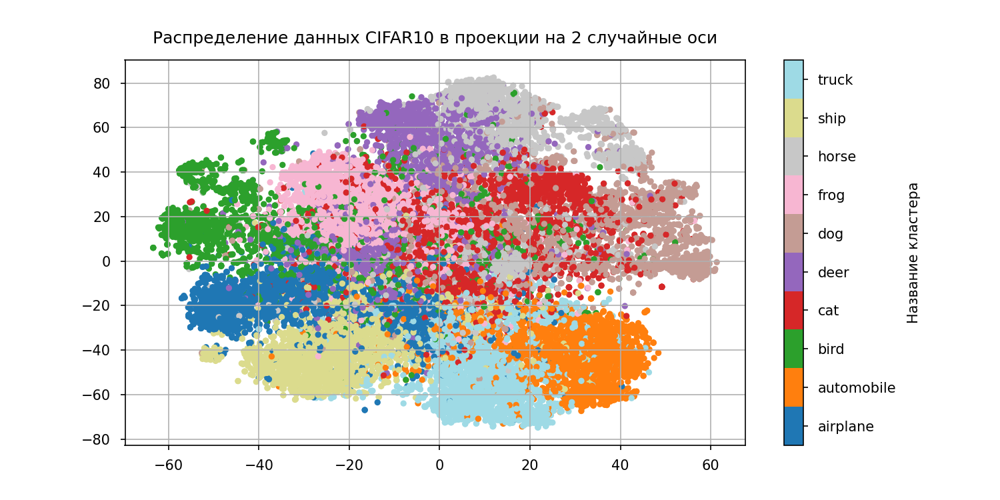

In [137]:
# Если картинка окажется слишком маленькой/большой, то поменяйте image_scale на подходящее значение

plot_interactive(
    new_data, np.vstack([cifar10_images_train, cifar10_images_test]),
    np.vstack([cifar10_labels_train, cifar10_labels_test]),
    cifar10_test_dataset.classes, n_dots=20000, image_scale=0.5
)

Вернёмся в статичный режим отрисовки изображений:

In [150]:
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 100

Теперь, когда мы можем визуализировать кластеризацию, можно сравнить алгоритмы из первой части на естественных данных.

<font color='magenta'>ВЫВОД:</font> особенностью можно назвать различную плотность кластеров и похожесть одних кластеров на другие. Например, кластеры кошек и собак достаточно перемешаны, а механические транспортные средства (все 4) по большей части достаточно хорошо отделены от остальных. Кошки, наверное, отделяются как кластер наименьшим образом.

#### <font color='orange'>**Задание 2.7 [кросспроверка, 3 балла][код]**</font>
Подберите параметры `KMeans`, `DBSCAN`, `AgglomerativeClustering` используя силуэт и B-Cubed. Визуализируйте получившиеся кластеризации также, как и в задании [**1.с.4**](#task_1.c.4). Для ускорения перебора можете производить его на небольшой доле от всех объектов ($1000\text{-}2000$ объектов).

*Замечание:* Алгоритмы кластеризации нужно применять к исходному векторному представлению. Снижение размерности используется только для визуализации.

In [139]:
n_objects = 2000

In [143]:
scaler = StandardScaler()
data_transformed = scaler.fit_transform(cifar10_deep_features_train[:n_objects])
labels = cifar10_labels_train[:n_objects]

In [185]:
sil_scores = []
bcubed_scores = []

for n in range(1, 100 + 1):
    model = KMeans(n_clusters=n, n_init='auto', random_state=42)
    labels_pred = model.fit_predict(data_transformed)
    sil_scores.append(silhouette_score(data_transformed, labels_pred))
    bcubed_scores.append(bcubed_score(labels, labels_pred))

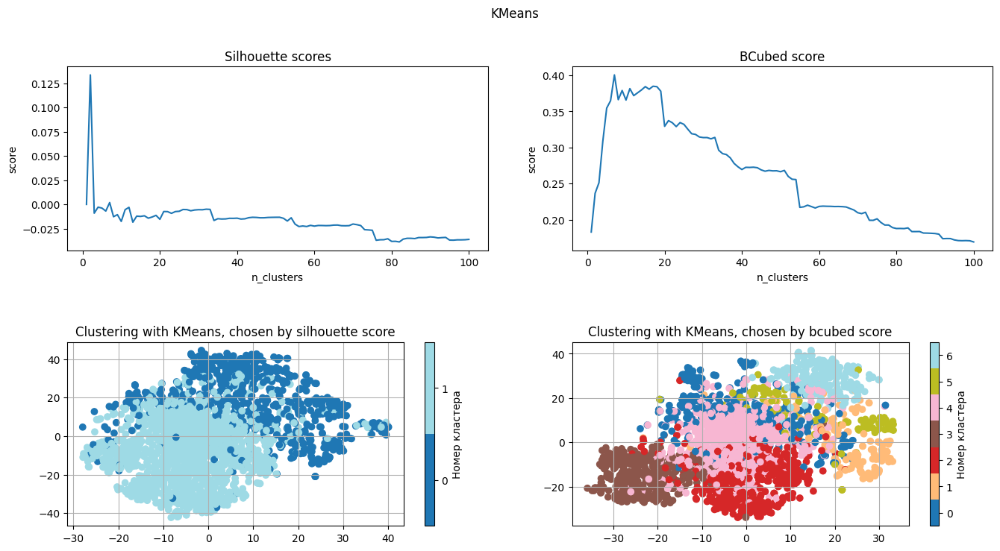

In [151]:
# plot_2d_data(data, labels, title=f'KMeans with K={n_clust}, random_state={state}', cmap='tab20', ax=None)
trans = TSNE()
model = KMeans(n_clusters=n, n_init='auto', random_state=42)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 8))
plt.subplots_adjust(hspace=0.5)

plt.suptitle('KMeans')
axes[0, 0].set_title('Silhouette scores')
axes[0, 0].set_xlabel('n_clusters')
axes[0, 0].set_ylabel('score')
axes[0, 1].set_title('BCubed score')
axes[0, 1].set_xlabel('n_clusters')
axes[0, 1].set_ylabel('score')
axes[0, 0].plot(range(1, 101), sil_scores)
axes[0, 1].plot(range(1, 101), bcubed_scores)

axes[1, 1].set_title('Clustering with KMeans, chosen by bcubed score')
model.set_params(n_clusters=(np.argmax(bcubed_scores) + 1))
plot_2d_data(trans.fit_transform(data_transformed), model.fit_predict(data_transformed), ax=axes[1, 1])
axes[1, 1].set_title('Clustering with KMeans, chosen by bcubed score')

model.set_params(n_clusters=(np.argmax(sil_scores) + 1))
plot_2d_data(trans.fit_transform(data_transformed), model.fit_predict(data_transformed), ax=axes[1, 0])
axes[1, 0].set_title('Clustering with KMeans, chosen by silhouette score')
plt.show()

In [186]:
print(f'Best "n_clusters - silhouette score": {np.argmax(sil_scores) + 1, sil_scores[np.argmax(sil_scores)]}')
print(f'Best "n_clusters - bcubed score": {np.argmax(bcubed_scores) + 1, bcubed_scores[np.argmax(bcubed_scores)]}')

Best "n_clusters - silhouette score": (2, 0.13350074506439913)
Best "n_clusters - bcubed score": (7, 0.4005554351173609)


In [187]:
model = KMeans(n_clusters=(np.argmax(sil_scores) + 1), n_init='auto', random_state=42)
real = labels
pred = model.fit_predict(data_transformed)
eq_C = pred[:, np.newaxis] == pred
eq_L = real[:, np.newaxis] == real
corr = eq_C * eq_L
prec = eq_C * corr
prec = np.mean(np.mean(prec, axis=1, where=eq_C))
print('Precision:', prec)
rec = eq_L * corr
rec = np.mean(np.mean(rec, axis=1, where=eq_L))
print('Recall:', rec)

Precision: 0.14127957345636458
Recall: 0.7263560639020771


In [188]:
model = KMeans(n_clusters=(np.argmax(bcubed_scores) + 1), n_init='auto', random_state=42)
real = labels
pred = model.fit_predict(data_transformed)
eq_C = pred[:, np.newaxis] == pred
eq_L = real[:, np.newaxis] == real
corr = eq_C * eq_L
prec = eq_C * corr
prec = np.mean(np.mean(prec, axis=1, where=eq_C))
print('Precision:', prec)
rec = eq_L * corr
rec = np.mean(np.mean(rec, axis=1, where=eq_L))
print('Recall:', rec)

Precision: 0.3415357442777349
Recall: 0.48423442488470697


In [189]:
sil_scores = []
bcubed_scores = []

for n in range(1, 100 + 1):
    model = AgglomerativeClustering(n_clusters=n)
    labels_pred = model.fit_predict(data_transformed)
    sil_scores.append(silhouette_score(data_transformed, labels_pred))
    bcubed_scores.append(bcubed_score(labels, labels_pred))

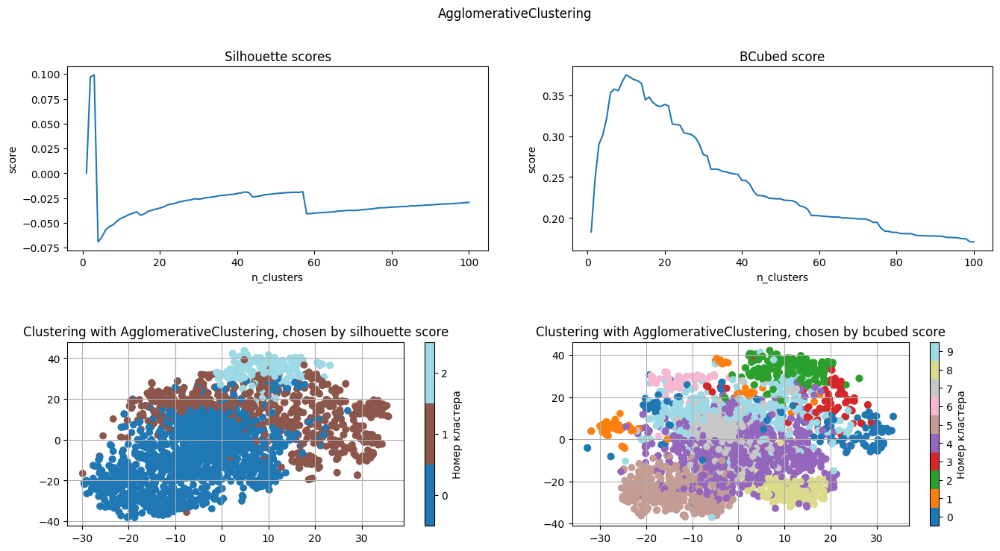

In [155]:
trans = TSNE()
model = AgglomerativeClustering()
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 8))
plt.subplots_adjust(hspace=0.5)

plt.suptitle('AgglomerativeClustering')
axes[0, 0].set_title('Silhouette scores')
axes[0, 0].set_xlabel('n_clusters')
axes[0, 0].set_ylabel('score')
axes[0, 1].set_title('BCubed score')
axes[0, 1].set_xlabel('n_clusters')
axes[0, 1].set_ylabel('score')
axes[0, 0].plot(range(1, 101), sil_scores)
axes[0, 1].plot(range(1, 101), bcubed_scores)

axes[1, 1].set_title('Clustering with AgglomerativeClustering, chosen by bcubed score')
model.set_params(n_clusters=(np.argmax(bcubed_scores) + 1))
plot_2d_data(trans.fit_transform(data_transformed), model.fit_predict(data_transformed), ax=axes[1, 1])
axes[1, 1].set_title('Clustering with AgglomerativeClustering, chosen by bcubed score')

model.set_params(n_clusters=(np.argmax(sil_scores) + 1))
plot_2d_data(trans.fit_transform(data_transformed), model.fit_predict(data_transformed), ax=axes[1, 0])
axes[1, 0].set_title('Clustering with AgglomerativeClustering, chosen by silhouette score')
plt.show()

In [190]:
print(f'Best "n_clusters - silhouette score": {np.argmax(sil_scores) + 1, sil_scores[np.argmax(sil_scores)]}')
print(f'Best "n_clusters - bcubed score": {np.argmax(bcubed_scores) + 1, bcubed_scores[np.argmax(bcubed_scores)]}')

Best "n_clusters - silhouette score": (3, 0.09907925472449465)
Best "n_clusters - bcubed score": (10, 0.3747576818244678)


In [191]:
model = AgglomerativeClustering(n_clusters=(np.argmax(sil_scores) + 1))
real = labels
pred = model.fit_predict(data_transformed)
eq_C = pred[:, np.newaxis] == pred
eq_L = real[:, np.newaxis] == real
corr = eq_C * eq_L
prec = eq_C * corr
prec = np.mean(np.mean(prec, axis=1, where=eq_C))
print('Precision:', prec)
rec = eq_L * corr
rec = np.mean(np.mean(rec, axis=1, where=eq_L))
print('Recall:', rec)

Precision: 0.18327688137609713
Recall: 0.6957287870038096


In [192]:
model = AgglomerativeClustering(n_clusters=(np.argmax(bcubed_scores) + 1))
real = labels
pred = model.fit_predict(data_transformed)
eq_C = pred[:, np.newaxis] == pred
eq_L = real[:, np.newaxis] == real
corr = eq_C * eq_L
prec = eq_C * corr
prec = np.mean(np.mean(prec, axis=1, where=eq_C))
print('Precision:', prec)
rec = eq_L * corr
rec = np.mean(np.mean(rec, axis=1, where=eq_L))
print('Recall:', rec)

Precision: 0.35928994316240576
Recall: 0.3916171336230652


In [193]:
space = {
    'eps': hp.uniform('eps', 15, 100),
    'min_samples': hp.randint('min_samples', 1, 101),
}

def objective(params):
    model = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
    labels_pred = model.fit_predict(data_transformed)
    return -silhouette_score(data_transformed, labels_pred)

# Perform hyperparameter optimization with nested cross-validation
trials = Trials()
best_params = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=100, trials=trials)

print("Best hyperparameters:", best_params)

100%|██████████| 100/100 [02:11<00:00,  1.32s/trial, best loss: -0.32737758563373726]
Best hyperparameters: {'eps': 81.87624284786368, 'min_samples': 90}


In [194]:
model = DBSCAN(eps=best_params['eps'], min_samples=best_params['min_samples'])
labels_pred = model.fit_predict(data_transformed)
print(silhouette_score(data_transformed, labels_pred))

0.32737758563373726


In [195]:
real = labels
pred = model.fit_predict(data_transformed)
eq_C = pred[:, np.newaxis] == pred
eq_L = real[:, np.newaxis] == real
corr = eq_C * eq_L
prec = eq_C * corr
prec = np.mean(np.mean(prec, axis=1, where=eq_C))
print('Precision:', prec)
rec = eq_L * corr
rec = np.mean(np.mean(rec, axis=1, where=eq_L))
print('Recall:', rec)

Precision: 0.10110305152576288
Recall: 0.9990045454545454


In [196]:
params = [trial['misc']['vals'] for trial in trials.trials]
params_eps = [param['eps'] for param in params]
params_ms = [param['min_samples'] for param in params]
scores = [-trial['result']['loss'] for trial in trials]

In [205]:
space = {
    'eps': hp.uniform('eps', 15, 100),
    'min_samples': hp.randint('min_samples', 1, 101),
}

def objective(params):
    model = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
    labels_pred = model.fit_predict(data_transformed)
    return -bcubed_score(labels, labels_pred)

# Perform hyperparameter optimization with nested cross-validation
trials1 = Trials()
best_params1 = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=300, trials=trials1)

print("Best hyperparameters:", best_params1)

100%|██████████| 300/300 [04:30<00:00,  1.11trial/s, best loss: -0.23554806371260326]
Best hyperparameters: {'eps': 46.14553972552124, 'min_samples': 2}


In [206]:
model = DBSCAN(eps=best_params1['eps'], min_samples=best_params1['min_samples'])
real = labels
pred = model.fit_predict(data_transformed)
eq_C = pred[:, np.newaxis] == pred
eq_L = real[:, np.newaxis] == real
corr = eq_C * eq_L
prec = eq_C * corr
prec = np.mean(np.mean(prec, axis=1, where=eq_C))
print('Precision:', prec)
rec = eq_L * corr
rec = np.mean(np.mean(rec, axis=1, where=eq_L))
print('Recall:', rec)

Precision: 0.14455830184930327
Recall: 0.6356422650884707


In [207]:
params1 = [trial['misc']['vals'] for trial in trials1.trials]
params_eps1 = [param['eps'] for param in params1]
params_ms1 = [param['min_samples'] for param in params1]
scores1 = [-trial['result']['loss'] for trial in trials1]

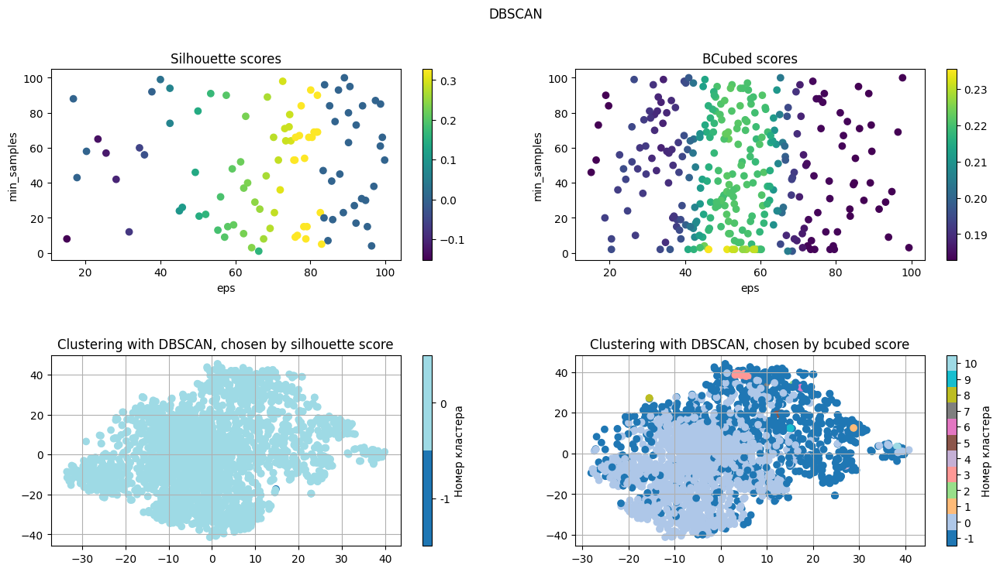

In [208]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 8))
plt.subplots_adjust(hspace=0.5)
plt.suptitle('DBSCAN')
trans = TSNE()
model = DBSCAN()

axes[0, 0].set_title('Silhouette scores')
axes[0, 0].set_ylabel('min_samples')
axes[0, 0].set_xlabel('eps')
pl = axes[0, 0].scatter(params_eps, params_ms, c=scores)
plt.colorbar(pl, ax=axes[0, 0])

axes[0, 1].set_title('BCubed scores')
axes[0, 1].set_ylabel('min_samples')
axes[0, 1].set_xlabel('eps')
pl = axes[0, 1].scatter(params_eps1, params_ms1, c=scores1)
plt.colorbar(pl, ax=axes[0, 1])

model.set_params(min_samples=best_params1['min_samples'], eps=best_params1['eps'])
plot_2d_data(trans.fit_transform(data_transformed), model.fit_predict(data_transformed), ax=axes[1, 1])
axes[1, 1].set_title('Clustering with DBSCAN, chosen by bcubed score')

model.set_params(min_samples=best_params['min_samples'], eps=best_params['eps'])
plot_2d_data(trans.fit_transform(data_transformed), model.fit_predict(data_transformed), ax=axes[1, 0])
axes[1, 0].set_title('Clustering with DBSCAN, chosen by silhouette score')
plt.show()

plt.show()

#### <font color='orange'>**Задание 2.8 [кросспроверка, 3 балла][вопрос]** </font>
1. Какие алгоритмы справились с кластеризацией естественных данных?
2. Получилось ли подобрать оптимальное число кластеров с помощью BCubed и коэффициента силуэта?
3. Объясните почему коэффициент силуэта не позволил выполнить подбор оптимальных гиперпараметров.

<font color='magenta'>*Ваш ответ здесь:*</font> (ｏ・_・)ノ”(ノ_<、) <br>
1. С кластеризацией справились в какой-то степени все (одинаково не очень, если угодно). AgglomerativeClustering смог найти истинное число кластеров, но они перемешаны, и precision для модели с парметрами, подобранными по bcubed, только 0.1832 при выдаче 0.69 от истинно позитивных значений. Кажется, в определенных случаях у DBSCANа наилучший результат (некоторые прогоны давали такой результат, выше представлен лишь один из прогонов), хотя для многоразмерных данных он обычно не подходит. У DBSCANа многие объекты просто были засунуты в мусор (но это и неважно: какая разница: будет true-кошка predicted-самолётом или мусором?). У него в одном из прогонов были сбалансированные метрики precision и recall - на уровне 0.48 и 0.41 соответственно. В прогоне, представленном в ноутбуке, хорошие параметры подобрать не вышло. Видно, что это ненадежный алгоритм. Аггломеративный кластеринг, с другой стороны, боеле надежный. <br>
2. Коэффициент силуэта снова не позволил подобрать нужное число кластеров. Он дает большие значения метрики небольшому числу хорошо отделимых кластеров, что не соответствует данным. BCubed позволи получить сколь-либо значимые результаты, в отличие от силуэта <br>
3. Опять же, коэффициент силуэта получается большим для малого числа хорошо отделимых кластеров, при этом совсем неизвестна точность выдачи, которая крайне низка для небольшого числа кластеров. Отсутствие внешней разметки - это также причина в данном случае (силуэт не учитывает голд стандард).

Интересный способ визуализации Иерархической кластеризации — построение дендрограммы. Такой способ визуализации позволяет анализировать, как именно связаны между собой объекты, подбирать оптимальное число кластеров, а также определять, какие классы отделяются "хорошо" от других классов, а какие классы перемешаны в одном кластере.

In [200]:
def plot_dendrogram(model, labels, classes, ax):
    n_classes = len(classes)
    n_samples = len(model.labels_)
    n_u_connections = model.children_.shape[0]
    colors = plt.get_cmap('tab20', n_classes).colors

    bin_counts = np.zeros([n_u_connections, n_classes])
    for i, merge in enumerate(model.children_):
        current_bin_count = np.zeros(n_classes)
        for child_idx in merge:
            if child_idx < n_samples:
                current_bin_count[labels[child_idx]] += 1
            else:
                current_bin_count += bin_counts[child_idx - n_samples]

        bin_counts[i] = current_bin_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, np.sum(bin_counts, axis=1)]
    ).astype(float)

    def leaf_label_func(idx):
        if idx < len(labels):
            return None
        else:
            ratio = 100 * np.max(bin_counts[idx - n_samples]) / np.sum(bin_counts[idx - n_samples])
            if ratio < 100:
                return '{0:.0f}%'.format(ratio)
            else:
                return None

    def link_color_func(idx):
        mode_class = np.argmax(bin_counts[idx - n_samples])
        return matplotlib.colors.to_hex(colors[mode_class], keep_alpha=True)

    scipy.cluster.hierarchy.dendrogram(
        linkage_matrix, ax=ax, link_color_func=link_color_func, leaf_label_func=leaf_label_func,
        orientation='right', truncate_mode="level", p=9
    )

    for idx, class_name in enumerate(classes):
        ax.plot([], [], c=matplotlib.colors.to_hex(colors[idx], keep_alpha=True), label=class_name)
    ax.legend()

    # Удалим накладывающиеся метки
    threshold = 55
    prev_position = -(threshold + 1)

    y_labels = ax.get_yaxis().get_ticklabels()
    for label in y_labels:
        if label.get_text() == '':
            continue

        _, position = label.get_position()
        if position - prev_position < threshold:
            label.set_text('')
        else:
            prev_position = position
    ax.get_yaxis().set_ticklabels(y_labels)

    ax.set_xlabel('Расстояние между кластерами')
    ax.set_ylabel('Доля объектов наибольшего класса в данном кластере')

    ax.set_title('Дендрограмма Иерархической Кластеризации')

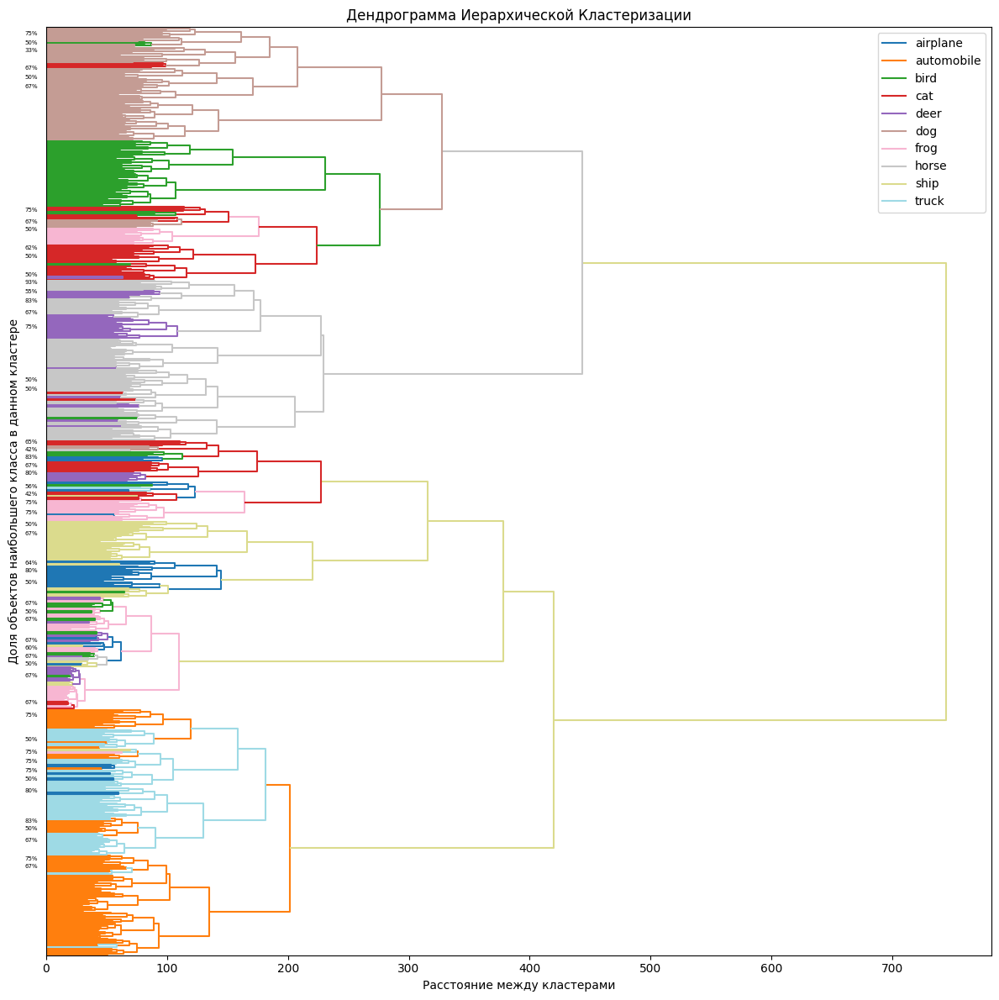

In [201]:
n_objects = 2000
model = AgglomerativeClustering(
    n_clusters=None, distance_threshold=0.0, compute_distances=True, compute_full_tree=True
)
model = model.fit(cifar10_deep_features_train[:n_objects])

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

plot_dendrogram(
    model,
    labels=cifar10_labels_train[:n_objects],
    classes=cifar10_train_dataset.classes,
    ax=ax
)

fig.tight_layout()
plt.show()

#### <font color='orange'>**Задание 2.9 [вопрос]** </font>

Проанализируйте получившуюся дендрограмму. Напишите свои наблюдения ниже.

<font color='magenta'>*Ваш ответ здесь:*</font> (ｏ・_・)ノ”(ノ_<、) <br>
1. Автомобили и грузовики похожи. Скопления одинаковых грузовиков и одинаковых автомобилей сконцентрированы близко друг к другу <br>
2. Кошек разбросало по всему пространству, как и было замечено ранее <br>
3. С лягушками та же история - они намешаны в другие кластеры. <br>
4. Есть примеси оленей в других кластерах <br>
5. Собаки сосредоточены довольно компактно, хотя по результатам алгоритмов понижения размерности это не скажешь. <br>
6. Лошади похожи на оленей <br>
7. Птицы довольно хорошо отделяюстя от других кластеров. <br>
8. Самолеты и корабли немного перемешаны, но в вместе достаточно неплохо отделяются от остальных кластеров <br>
9. Есть области похожих друг на друга изображений из разных кластеров, даже групп похожих изображений

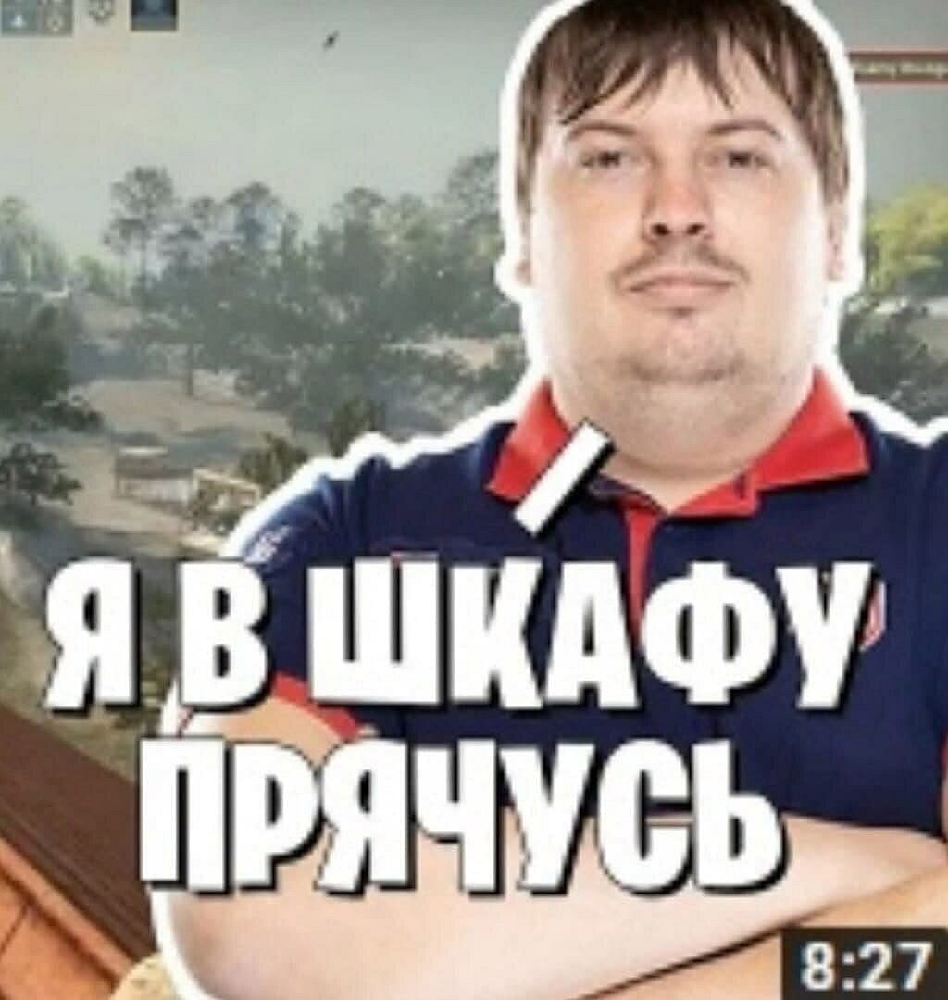